# Predicting Bike Rentals

## <font color="red">WORKFLOW</font>

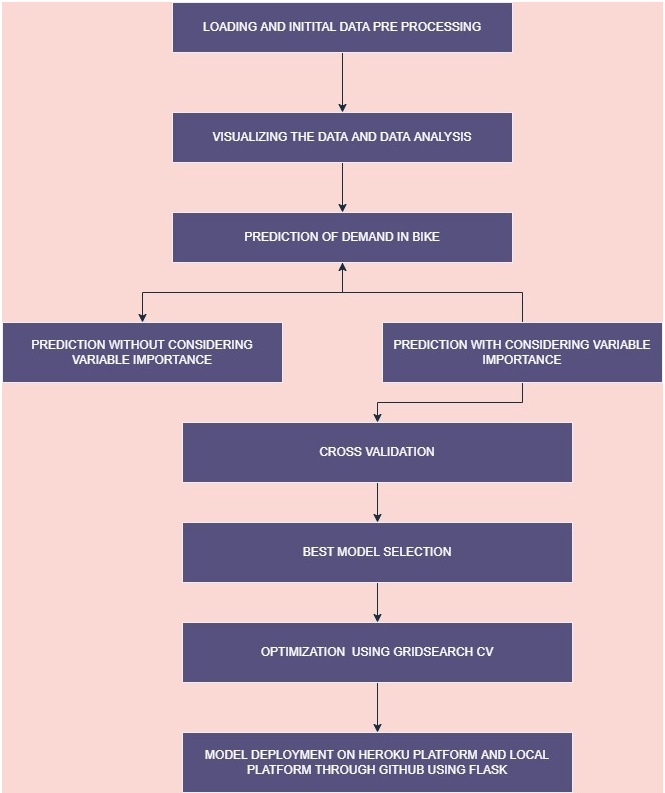

In [33]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

import sklearn
assert sklearn.__version__ >= "0.20"

import pandas as pd
assert pd.__version__ >= "1.0"
pd.options.mode.chained_assignment = None

# Common imports
import numpy as np
import os

import seaborn as sns
from plotly import graph_objects as go
from plotly.subplots import make_subplots

from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## Step 1: Loading and initial processing of the dataset

A paper that describes one related version of this dataset is: Sathishkumar V E, Jangwoo Park, and Yongyun Cho. 'Using data mining techniques for bike sharing demand prediction in metropolitan city.' Computer Communications, Vol.153, pp.353-366, March, 2020.

The data is stored in a CSV (comma separated variable) file and contains the following information 

 - Date: year-month-day
 - Rented Bike Count: Count of bikes rented at each hour
 - Hour: Hour of the day
 - Temperature: Temperature in Celsius
 - Humidity: %
 - Windspeed: m/s
 - Visibility: 10m
 - Dew point temperature: Celsius
 - Solar radiation: MJ/m2
 - Rainfall: mm
 - Snowfall: cm
 - Seasons: Winter, Spring, Summer, Autumn
 - Holiday: Holiday/No holiday
 - Functional Day: NoFunc(Non Functional Hours), Fun(Functional hours)



### <font color="green">Load the data set from the csv file into a DataFrame, and summarise it with at least two appropriate pandas functions.</font>

#### <font color="red">Loading the dataset</font>

In [3]:
# Loading the dataset from csv using pandas read_csv method into DataFrame.

df = pd.read_csv("SeoulBikeData.csv")

#### <font color="red">Displaying the data</font>

In [4]:
# Displaying the first 5 rows of the data

df.head(5)

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0,0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0,0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0,0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0,0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0,0,Winter,No Holiday,Yes


In [5]:
# Displaying the last 5 rows of the data

df.tail(5) 

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0,0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0,0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0,0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0,0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0,0,Autumn,No Holiday,Yes


#### <font color="red">Summarizing the dataset using describe method</font>

In [6]:
# Summarising the data using describe() method 

df.describe()

,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2)
count,8760.000000,8760.000000,8760.000000,8760.000000,8759.000000,8760.000000,8759.000000,8760.000000
mean,704.602055,11.502740,12.914361,58.240183,1.953237,1436.442808,4.074369,0.569111
std,644.997468,6.922779,12.347109,20.584774,21.376612,608.827735,13.061011,0.868746
min,0.000000,0.000000,-17.800000,-26.000000,0.000000,-678.000000,-30.600000,0.000000
25%,191.000000,6.000000,3.500000,42.000000,0.900000,939.500000,-4.700000,0.000000
50%,504.500000,12.000000,13.700000,57.000000,1.500000,1697.500000,5.100000,0.010000
75%,1065.250000,18.000000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000
max,3556.000000,24.000000,306.000000,309.000000,2000.000000,2000.000000,27.200000,3.520000


#### <font color="red">Summarizing the dataset using info method</font>

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature (C)            8760 non-null   float64
 4   Humidity (%)               8760 non-null   int64  
 5   Wind speed (m/s)           8759 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature (C)  8759 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8758 non-null   object 
 10  Snowfall (cm)              8760 non-null   object 
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

**From the above summary using describe and info method we can say that,**
- *From the above summary we can the statitical property of the data such as, Mean, standard deviation (std), minimum, maximum, and Inter quantile range IQR in the range of 25%, 50% and 75% and type of values in the each features.*

**<font color="purple">From the table we have following observations:</font>**

<u><font color="red">**Rented bike count**</font></u> 
- has **mean value** of 704 which mean that anytime there is an atleast of 704 bikes will be in demand by the customers. 
- he demand has the **standard deviation** of 645, which means that there is a change demand. Here, change can be positive or negative. Say, there could be an positive chnage which means that demand is increasing and there could be a potential change in demand about 645 rental bikes. If the change is negative, which means that there is decrease in demand by 645 rental bikes. 
- The **IQR values of 25%, 50% and 75%** describes the values within these percentile range. Here **25% is lower quantile boundry** below these 25% are ususally considered as the **outliers**, and similarly above 75% of the values are considered as the **outliers**. The **50% is the median.**. 
- The maximum and minimum values from table gives the maximum and minimum values of the data. 
- The value of data are int64 which a numeric format
 
 
<u><font color="red">**Hour**</font></u>
- The data has 24hrs of data from 2017 to till 2018 and we are using this data to analyse the houlry weather condition or we can say temporal deviation.
- The value of data are int64 which a numeric format


<u><font color="red">**Temperature**</font></u> 
- From the above sumamry we can see that the **temperature is in Celcius unit**.
- minimum temperature of weather is -17.80 C and maximum temeprature is 306 C. Here maximum temeprature 306 looks like an outlier. The mean temperature of the weather is an 12.91 C.
- the strandard deviation of 12.34 C means that temperature can change in postive or negative direction with the rate of 12.34 C. 
- The temperature within 3.5 to 22.5 C is considred to be within the IQR range.
- The value of data are float64 which a numeric format


<u><font color="red">**Humidity**</font></u> 
- From the above sumamry we can see that the **humidity is in % unit**.
- the minimum humidity of weather is -26% and maximum humidity is 74%. Here maximum humidity 309 looks like an outlier. 
- The mean humidity of the weather is an 58.24% and it has the strandard deviation of 20.58% which means that humidity can change in postive or negative direction with the rate of 20.584%. 
- The humidity within 42 to 74% is considred to be within the IQR range.
- The value of data are int64 which a numeric format


<u><font color="red">**Wind speed (m/s)**</font></u>
- From the above sumamry we can see that the **wind speed is in m/s unit**.
- the minimum wind speed of weather is 0m/s and maximum wind speed is 2000m/s. 
- Here maximum wind speed 2000 m/s looks like an outlier. The mean wind speed of the weather is an 1.95 m/s.
- the strandard deviation of 21.37m/s which means that humidity can change in postive or negative direction with the rate of 21.37m/s. 
- The wind speed within 0.93 to 2.3 m/s is considred to be within the IQR range.
- The value of data are float64 which a numeric format


<u><font color="red">**Visiblity (10m)**</font></u>
- From the above sumamry we can see that the **Visiblity is in (10m) unit**.
- the minimum Visiblity of weather is -678 and maximum Visiblity is 2000. 
- Here minimum Visiblity looks like an outlier. The mean Visiblity of the weather is an 1436.44.
- the strandard deviation of 608 which means that visiblity can change in postive or negative direction with the rate of 608. 
- The values of visiblity within 940 to 2000 is considred to be within the IQR range.
- The value of data are int64 which a numeric format



<u><font color="red">**Dew point temperature (C)**</font></u>
- From the above sumamry we can see that the **Dew point temperature is in Celcius unit**.
- the minimum dew point temperature of weather is -30.6 and maximum dew point temperature is 27.2. 
- Here minimum dew point temperature looks like an outlier. 
- The mean dew point temperature of the weather is an 4.07 C and it has the strandard deviation of 13.06 C which means that dew point temperature can change in postive or negative direction with the rate of 13.06 C. 
- The values of temperature within -4 to 14.8 is considred to be within the IQR range.
- The value of data are float64 which a numeric format


<u><font color="red">**Solar radition (Mj/m2)**</font></u>
- From the above sumamry we can see that the **Solar radition is in MJ/m2 unit**.
- the minimum solar radiation of weather is 0.0 and maximum solar radiation is 3.52 MJ/m2. 
- Here minimum dew point temperature looks like an outlier. 
- The mean dew point temperature of the weather is an 4.07 C and it has the strandard deviation of 0.87 Mj/m2 which means that solar radiation can change in postive or negative direction with the rate of 0.87 Mj/m2. 
- The values of solar radition within 0.0 to 0.93 is considred to be within the IQR range.
- The value of data are float64 which a numeric format

### 1.2 Initial visualisation

**<font color ="green">To get a feeling for the data it is a good idea to do some form of simple visualisation.  Display a set of histograms for the features as they are right now, prior to any cleaning steps.</font>**

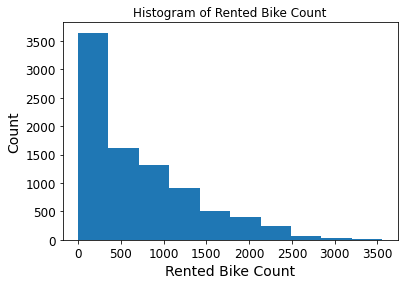

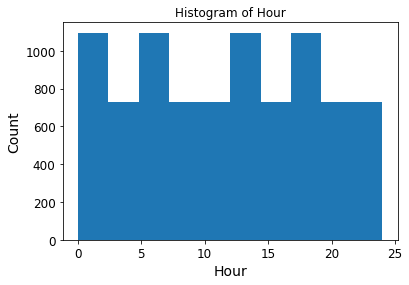

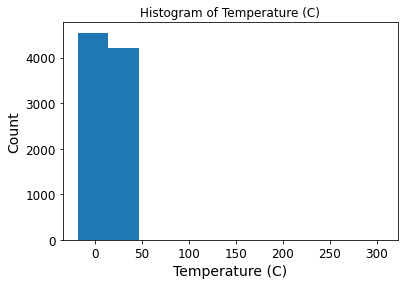

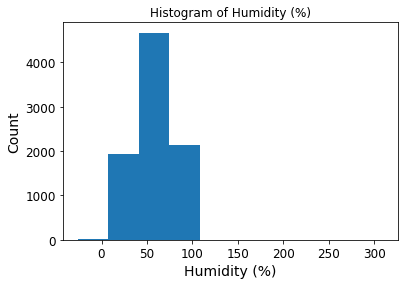

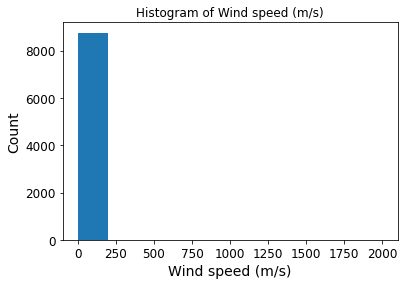

...

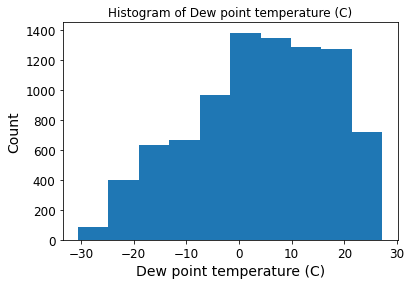

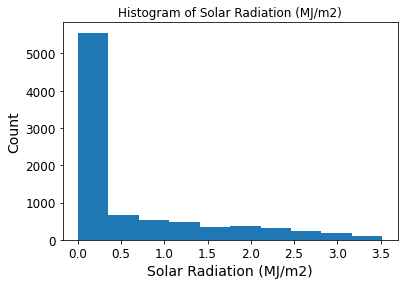

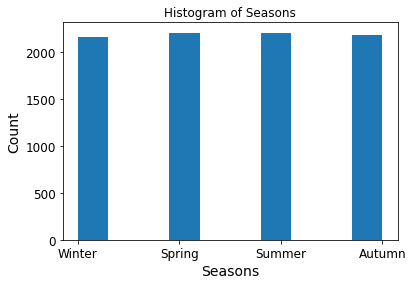

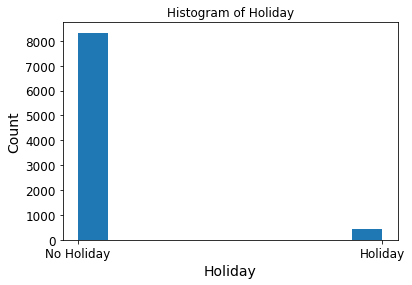

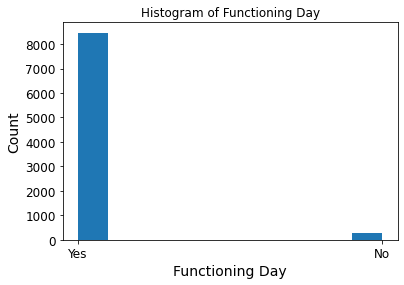

In [21]:
cols = ['Rented Bike Count', 'Hour', 'Temperature (C)', 'Humidity (%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature (C)',
       'Solar Radiation (MJ/m2)', 'Seasons','Holiday', 'Functioning Day']
for c in cols:
    plt.hist(df[c])
    plt.title("Histogram of "+c)
    plt.xlabel(c)
    plt.ylabel("Count")
    plt.show()

From the above plot we can say that tehre are features with right and left skewed and some features are categorical.

### 1.3 Removing unwanted information

<font color="green">The "Functioning day" feature records whether the bike rental was open for business on that day. For this assignment we are only interested in predicting demand on days when the business is open, so **remove rows from the DataFrame where the business is closed.** Hint: you can use the `DataFrame.loc()` function to do this. As a sanity check, ensure that the rows you are removing contain zero bike rentals! **After doing this, delete the Functioning Day feature from the DataFrame** and verify that this worked.</font>

<u><font color="red">Steps of removing unwanted information</font></u>
- Collect the Overall data
- Extract the days where buisness was not closed
- Check if there are any buisnees closed days from extracted data
- delete the functioning feature

In [22]:
### Extract the days where buisness was not closed

df_remove_unwanted = df.loc[df["Functioning Day"]!="No"]

# Check if there any No days in functioning feature
print("Total buisness closed days: ", df_remove_unwanted.loc[df_remove_unwanted["Functioning Day"]=="No"].shape[0])

# delete the functioning feature
del df_remove_unwanted["Functioning Day"]

# Checking all the columns after removing the functioning day
df_remove_unwanted.columns

Total buisness closed days:  0


Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature (C)', 'Humidity (%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature (C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday'],
      dtype='object')

From the above code we can see that, we have selected the data when the buisness is open and we have deleted sucessfully function feature from the dataset.

### 1.4 Numerical encoding

<font color="green">The main task is to predict future bike rental demand from this data. Hence the target feature is "Bike Rental Count". You will use regression techniques to do this, but this requires that the other features are numerical.

The Holiday and Season features both need to be converted to a simple numerical format. **Write code to convert the Holiday feature to 0 or 1 from its current format.**</font>

In [23]:
def binarize(data, cols, target):
    '''The Binarize function will help in converting the categorical data
    to binary with 0 or 1'''
    return np.where(data[cols]==target, 1, 0)

#### <font color="red">Converting the Holiday feature to 0 or 1</font>

In [24]:
print("Before the transformation unique values of the feature are: ", df_remove_unwanted["Holiday"].unique())
df_remove_unwanted["Holiday"] = binarize(df_remove_unwanted, "Holiday", "No Holiday")
print("After the transformation unique values of the feature are: ", df_remove_unwanted["Holiday"].unique())

Before the transformation unique values of the feature are:  ['No Holiday' 'Holiday']
After the transformation unique values of the feature are:  [1 0]


Here, we converted the categorical feature from No holiday as 1 and Holiday as 0.

<font color="green"> The Season feature is a little tricker. A number could be assigned to each season, but a better solution in this case is to **add 4 new columns**, each labelled by a season, and each storing 0 or 1 according to the season in each row. In other words, the "Winter" column contains 1 whenever the season is winter, and 0 elsewhere. **Do this for each season. Afterwards, remember to delete the Season feature.**</font>

**<font color="red">Converting the Season feature to 0 or 1</font>**

In [25]:
# Converting the Winter values to 1 and other as 0
df_remove_unwanted["Winter"] = binarize(df_remove_unwanted, "Seasons", "Winter")
# Converting the Spring values to 1 and other as 0
df_remove_unwanted["Spring"] = binarize(df_remove_unwanted, "Seasons", "Spring")
# Converting the Summer values to 1 and other as 0
df_remove_unwanted["Summer"] = binarize(df_remove_unwanted, "Seasons", "Summer")
# Converting the Autumn values to 1 and other as 0
df_remove_unwanted["Autumn"] = binarize(df_remove_unwanted, "Seasons", "Autumn")

# deleting the season feature
del df_remove_unwanted["Seasons"]

In [26]:
df_remove_unwanted.head()

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0,0,1,1,0,0,0
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0,0,1,1,0,0,0
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0,0,1,1,0,0,0
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0,0,1,1,0,0,0
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0,0,1,1,0,0,0


From the above code, we can say that all the season categories are now features and we have deleted the seasons feature from the dataset.

<font color="green">It is known that bike rentals depend strongly on whether it's a weekday or a weekend. **Replace the Date feature with a Weekday feature that stores 0 or 1 depending on whether the date represents a weekend or weekday.**  To do this, use the function `date_is_weekday` below, which returns 1 if it is a weekday and 0 if it is a weekend.

**Apply the function to the Date column in your DataFrame** (you can use `DataFrame.transform` to apply it).</font>

#### <font color="red">Transforming the date feature as weekend or weekday</font>

In [27]:
import datetime
def date_is_weekday(datestring):
    ### return 0 if weekend, 1 if weekday
    dsplit = datestring.split('/')
    wday = datetime.datetime(int(dsplit[2]),int(dsplit[1]),int(dsplit[0])).weekday()
    return int(wday<=4)

In [28]:
# transforming the date feature as weekend or weekday, weekend as 0 and weekday as 1
df_remove_unwanted["Date"] = df_remove_unwanted["Date"].transform(date_is_weekday)

In [29]:
df_remove_unwanted.head()

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
0,1,254,0,-5.2,37,2.2,2000,-17.6,0.0,0,0,1,1,0,0,0
1,1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0,0,1,1,0,0,0
2,1,173,2,-6.0,39,1.0,2000,-17.7,0.0,0,0,1,1,0,0,0
3,1,107,3,-6.2,40,0.9,2000,-17.6,0.0,0,0,1,1,0,0,0
4,1,78,4,-6.0,36,2.3,2000,-18.6,0.0,0,0,1,1,0,0,0


From the above code, we can say that date column has been succesfully transformed to weekday as 1 and weekend as 0

<font color="green">**Convert all the remaining data to numerical format**, with any non-numerical entries set to NaN.</font>

In [30]:
# checking the Nan 

df_remove_unwanted.isna().sum(axis=0)

Date                         0
Rented Bike Count            0
Hour                         0
Temperature (C)              0
Humidity (%)                 0
Wind speed (m/s)             1
Visibility (10m)             0
Dew point temperature (C)    1
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 2
Snowfall (cm)                0
Holiday                      0
Winter                       0
Spring                       0
Summer                       0
Autumn                       0
dtype: int64

- From the above data summary we can see that Wind speed, Dew point temperature, and Rainfall has Nan values.
- However, on in depth analysis we also found that there are some non-numerical values other than Nan.
- Rainfall and Snowfall data has string values, and these data also has entry of "No Record" 
- Therefore, We will convert these "No Record" data into Nan values
- We will also convert the Rainfall and Snowfall features to numerical form.
- Converting the **string data to numeric and setting error= coerce**, so that any non numerical values like No Record will set to Nan

In [31]:
# Converting Rain fall data to numeric
df_remove_unwanted["Rainfall(mm)"] = pd.to_numeric(df_remove_unwanted["Rainfall(mm)"], errors='coerce')
# Converting the Snowfall data to numeric
df_remove_unwanted["Snowfall (cm)"] = pd.to_numeric(df_remove_unwanted["Snowfall (cm)"], errors='coerce')

In [32]:
df_clean = df_remove_unwanted.copy()

## Step 2: Visualise the data and perform further processing

### 2.1 Visualisation

Use **at least two graphical methods to display your data** and **identify** problematic entries. **Write one sentence** that summarises what you found about problematic entries.

**Problemtic entries:**
- Here problemtic entrie are those with wrong values 
- Problemetic entries are the subset of Outliers 
- Outliers involve both problemetric entries and entrie with out of distribution

In [34]:
def getbounds(y):
    '''Function for calaculating the upperbound and lowerbound'''
    q1,q3= y.quantile(q=0.25),y.quantile(q=0.75)
    iqr = q3-q1 
    upperbound, lowerbound = q3+1.5*iqr, q1-1.5*iqr
    return upperbound, lowerbound

In [36]:
def zoutlier(x):
    '''Function for calclating Z outlier'''
    return ((x-np.mean(x))/np.std(x))

In [37]:
def scatterbox(x,y,label,title,xaxis_title):
    '''Function for plotting scatter plot and box plot'''
    upperbound, lowerbound = getbounds(y)
    up_zout, low_zout = getbounds(zoutlier(y))
    
    fig = make_subplots(rows=1, cols=3)
    
    fig.add_trace(go.Scatter(x=x, y=y, name=label, mode="markers"), row=1, col=1)
    fig.add_hline(y=upperbound, line_dash="dot", row=1, col=1)
    fig.add_hline(y=lowerbound, line_dash="dot", row=1, col=1)
    
    fig.add_trace(go.Box(y=y, name=label), row=1, col=2)
    fig.add_hline(y=upperbound, line_dash="dot", row=1, col=2)
    fig.add_hline(y=lowerbound, line_dash="dot", row=1, col=2)
    
    fig.add_trace(go.Box(y=zoutlier(y), name="Outlier"), row=1, col=3)
    fig.add_hline(y=up_zout, line_dash="dot", row=1, col=3)
    fig.add_hline(y=low_zout, line_dash="dot", row=1, col=3)
    
    fig.update_layout(title=title, title_x=0.5, xaxis_title=xaxis_title)
    fig.update_yaxes(title_text="Humidity values", row=1, col=1) 
    fig.update_yaxes(title_text="Humidity Range", row=1, col=2)
    fig.update_yaxes(title_text="Outliers", row=1, col=3)
    fig.show()

### Univariate data analysis

- In this section, we will do the univariate analysis by taking individual feature and we will identify the problemetic entries and data distribution

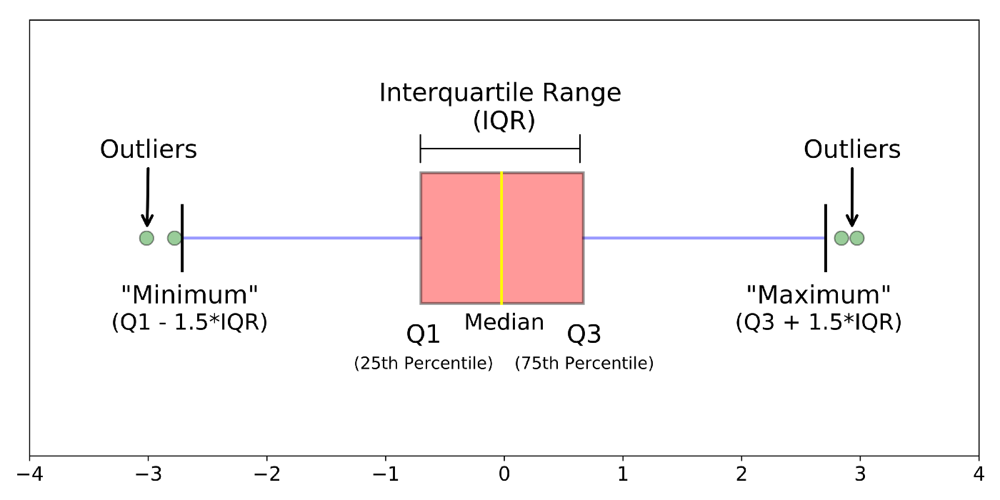

- The above figure is an outlier illustration. Above the Maximum boundry and beloe the Minimum boundry we will consider the values as outliers.

#### Humidity

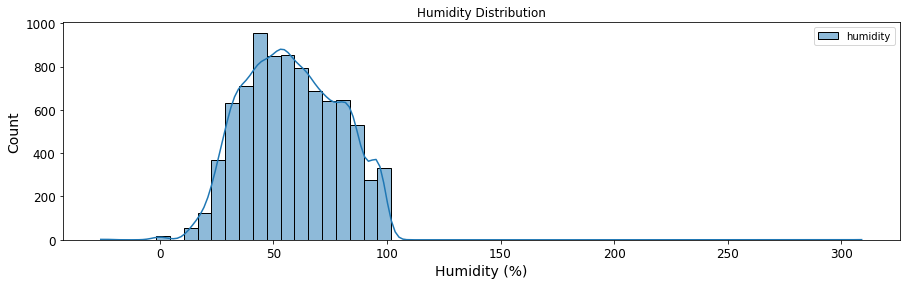

In [38]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= "Humidity (%)", bins=55, kde=True, label="humidity")
plt.title("Humidity Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean["Humidity (%)"],"humidity", "humidity distribution", "Total data")

In [39]:
# Datsets when humidity < 0 

df_clean[df_clean["Humidity (%)"]<0]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
3111,1,1038,15,14.2,-24,1.8,1743,-6.1,2.60,0.0,0.0,1,0,1,0,0
3112,1,1185,16,15.3,-24,1.5,1534,-5.1,2.00,0.0,0.0,1,0,1,0,0
3113,1,1479,17,15.3,-26,0.9,1257,-4.1,1.39,0.0,0.0,1,0,1,0,0


In [40]:
# Datasets when Humidity > 100 %
df_clean[df_clean["Humidity (%)"]>100]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
1030,1,186,22,-6.9,309,1.6,2000,-18.5,0.0,0.0,0.0,1,1,0,0,0


**<font color="red">Dsitribution analysis</font>**
- From the above distribution plot we can see that kernel density estimation curve of "Humidity" follows bell shaped curve which resembles the normal distribution. Hence Humidity values are normally distributed. 
- From the distribution majority of the humidity values falls within the 0 to 100. values within 40% to 50% of the humidity has occured frequently and has the frequency of approximately 800 to 1000.


**<font color="red">Outlier analysis</font>**

- <u>Humidity:</u> It is the amount of the water vapour in the air.
- The value of the humidity ranges from 0% to 100%
- 100% is the maximum of amount water can be hold in the air for humidity [reference: https://manual.museum.wa.gov.au/book/export/html/89]
- The dew point temperature can be negative, however, humidity values are within 0 to 100% 
- From the above plot we can see we have humidity that is greater than 100% and we do have humidity lesser than 0%.
-  We have total of 3 values that are less than 0% and has outlier value of approximately -3.96 and one maximum outlier of 309% with outlier value of 12.11.

#### Temperature

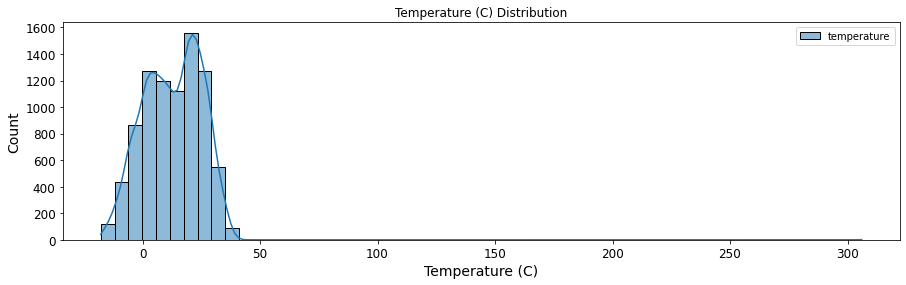

In [41]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= "Temperature (C)", bins=55, kde=True, label="temperature")
plt.title("Temperature (C) Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean["Temperature (C)"],"temperature", "temperature distribution", "Total data")

In [42]:
# checking the outlier value in temperature

df_clean[df_clean["Temperature (C)"]>300]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
6201,1,876,9,306.0,55,1.1,2000,20.5,1.46,0.0,0.0,1,0,0,1,0


**<font color="red">Distribution analysis</font>**
- From the above temperature distribution we can see that temperature values are within the range of 0 to 50 and temperature like 20-30 (C) has occured frequently comparing temperature like 0 to 10 (C) and 40 to 50 (C).

- From the above distribution plot we can see that kernel density estimation curve of "Temperature" follows bell shaped curve which resembles the normal distribution.


**<font color="red">Outlier analysis</font>**

- <u>Temperature:</u> From the outlier analysis, we can say that the temperature 306 is an outlier. The Z score of temperature is 23.42 at the temperature equal to 306 C.

#### Rented bike count

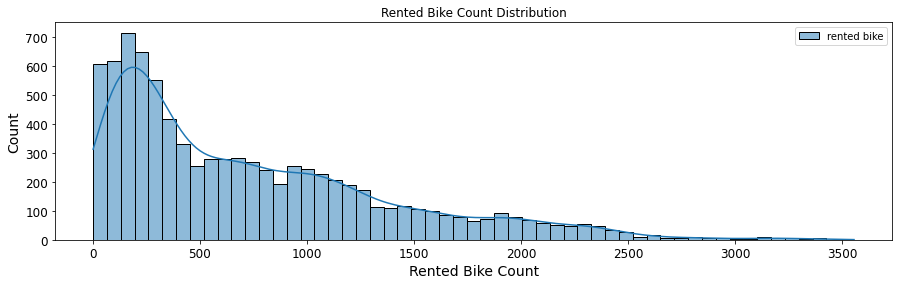

In [43]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= "Rented Bike Count", bins=55, kde=True, label="rented bike")
plt.title("Rented Bike Count Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean["Rented Bike Count"],"rented bike count", 
           "Rented bike count", "Total data")

**<font color="red">Distribution analysis</font>**
- From the above distribution plot we can see that bike rental counts distribution follows the right skewed distribution. 
- From the distribution we can see that there is atleast of 500 bike demand because total bike rentals within 0 to 500 has the heighest probablity comparing the demand like after 500.
- After 500 there is a gradual decrease in the demand. It could also mean that during peak hour we can expect there is an average of 500 demand in the bike for rentals.
- Hence, knowing this we can rebalance the demand and keep more bikes at the pickup spots.


**<font color="red">Outlier analysis</font>**
- For the outlier analysis we can see that there are values above the boxplot whisker, howevver these values are not much and they are only 152 values so we will remove the outlier in further steps. 

#### Wind speed

**Before considering outlier plot for wind speed**

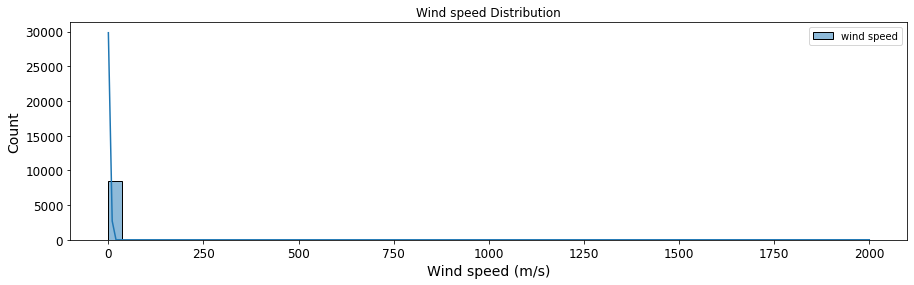

In [44]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= 'Wind speed (m/s)', bins=55, kde=True, label="wind speed")
plt.title("Wind speed Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean['Wind speed (m/s)'],'Wind speed (m/s)', 
           "Wind speed", "Total data")

**After removing the outlier plot**

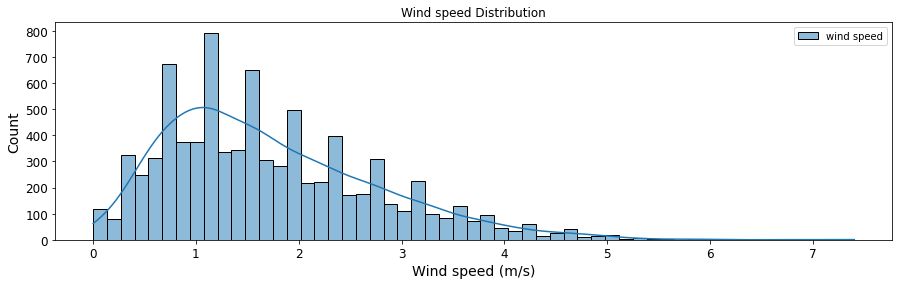

In [45]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean[df_clean["Wind speed (m/s)"]!=2000], x= 'Wind speed (m/s)', bins=55, kde=True, label="wind speed")
plt.title("Wind speed Distribution")
plt.legend()
plt.show();
scatterbox(df_clean[df_clean["Wind speed (m/s)"]!=2000].index, df_clean[df_clean["Wind speed (m/s)"]!=2000]['Wind speed (m/s)'],
           'Wind speed (m/s)', "Wind speed", "Total data")

**Distribution analysis**
- From the above two type sof analysis that is before considering the oputlier and after considering the outlier we can see the distribution of the data clearly.
- In order to do the analysis we didnt consider the value 2000 as it was an outlier.
- From the above plot we can see that wind speed distribution has bell shaped and follows normal distributioin. 
- From the wind speed distribution we can see that there is an average 1-2 m/s of wind speed and wind speed direction in consideration is an important factor because it delays the travel time from one place to another. 
- Eg: In flight the pilot always check the wind speed because it affects the flight travel time. 

**Outlier analysis**

- Using boxplot we can see that in "Before considering outlier" 2000 had a 91.8 z score value which is above theupper boundry level for considering the outlier.
- Therefore, for "After considering outlier" we did not included the 2000 value sample, for clear analysis.
- From the "After considering outlier" analysis we can see that there are still outlier above whisker level and these values are scattered across (shown in scatter plot). 
- For further analysis we will discard the values above the upper boundry level.

#### Visiblity (10m)

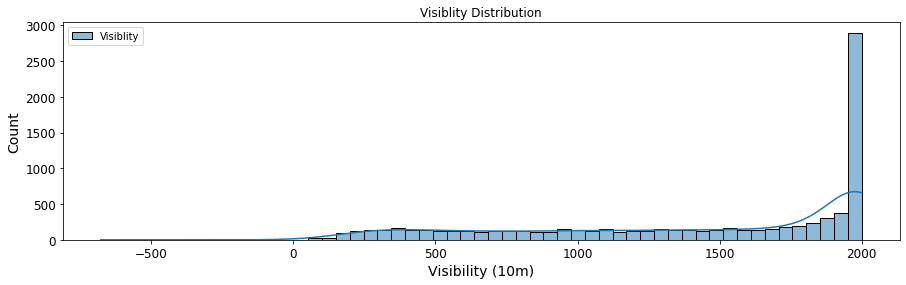

In [46]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= 'Visibility (10m)', bins=55, kde=True, label="Visiblity")
plt.title("Visiblity Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean['Visibility (10m)'],'Visibility (10m)', "Visiblity", "Total data")

**Distribution analysis**

- From the above distribution we can see that the distribution is left skewed.
- The distribution does not resembles the proper bell curve

**Outlier analysis**

- Using outlier analysis, we can see that there is an outlier of -678 Visiblity and has a zoutlier score of -3.46. Therefore for modeling we will not consider this value.

#### Dew point temperature (C)

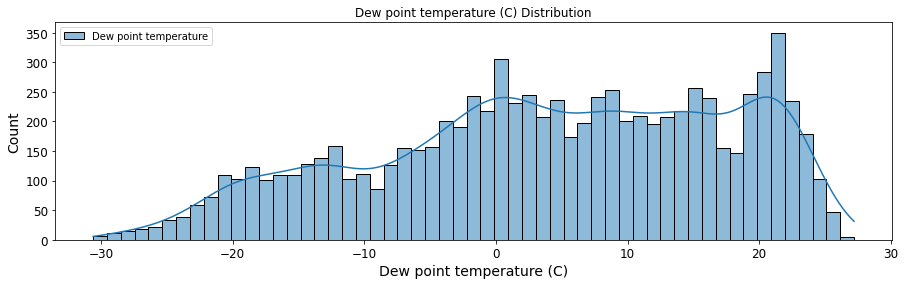

In [47]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= 'Dew point temperature (C)', bins=55, kde=True, label="Dew point temperature")
plt.title("Dew point temperature (C) Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean['Dew point temperature (C)'],'Dew point temperature', 
           "Dew point temperature", "Total data")

**Distribution analysis**

- From the above distribution plot we can see that kernel desity estimation of dew point temperature follows the bell shaped distribution. Hence the data are normally distributed. 
- Form the distribution we can see that the most frequent dew temperature are within the -10 to +10 (C).
- From the distribution we can see that there is mean of 4 (C) as dew point temperature any time.

**Outlier analysis**
- From the outlier analysis, we can see that value sof dew point temperature are well distributed. 
- Dew point temperature does not have any outlier above or below the boundry level

#### Solar Radiation

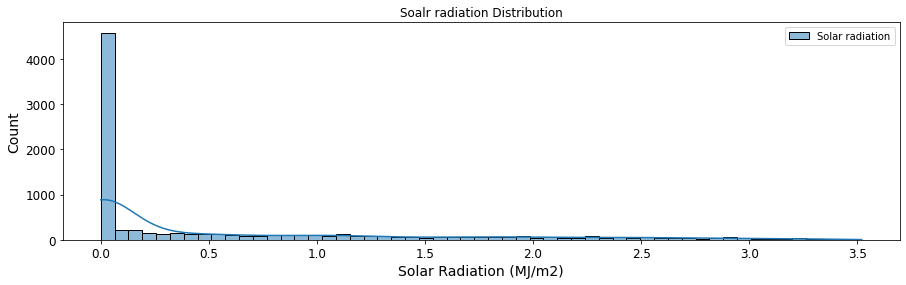

In [48]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= 'Solar Radiation (MJ/m2)', bins=55, kde=True, label="Solar radiation")
plt.title("Soalr radiation Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean['Solar Radiation (MJ/m2)'],'Solar Radiation (MJ/m2)', 
           'Solar Radiation (MJ/m2)', "Total data")

**Distribution analysis**

- From the above solar radition distribution we can see that the distribution follows the right skewed. 
- Distribution has the mean solar radiation of 0.07 (Mj/m2) 
- where as, maximum solar radiation is 8.0 (Mj/m2)
- The distribution has lot of outlier in right side, therefore it is right skewed.

**Outlier analysis**
- From the outlier analysis we can see that, there are values above the whisker level of box plot.
- However, the values are below the upper boundry level and we will not consider these values as the outlier in the data.

#### Rainfall (mm)

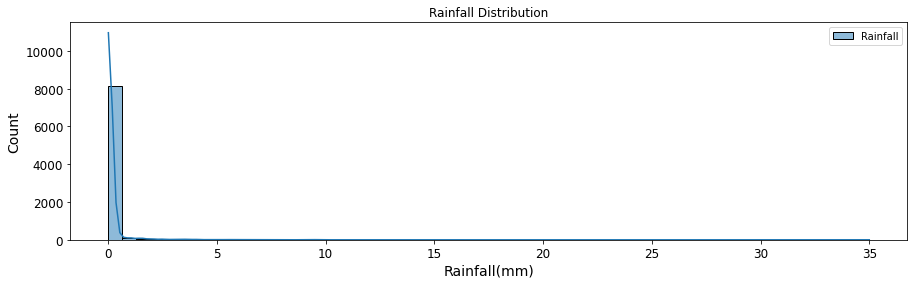

In [49]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= 'Rainfall(mm)', bins=55, kde=True, label="Rainfall")
plt.title("Rainfall Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean['Rainfall(mm)'],'Rainfall(mm)','Rainfall(mm)', "Total data")

**Distribution analysis**

- From the above Rainfall distribution we can see that the distribution follows the left skewed. 
- Values in the distribution is much denser in left side compared to right side.


**Outlier analysis**
- From the outlier analysis we can see that, there are lot of outliers above the upper boundry level.
- Above the whisker level of box plot are values above the upper boundry level, and we will consider these values as the outlier in the data.
- However, we will remove the outlier only if the Rainfall feature important for this prental bike demand prediction.

#### Snowfall

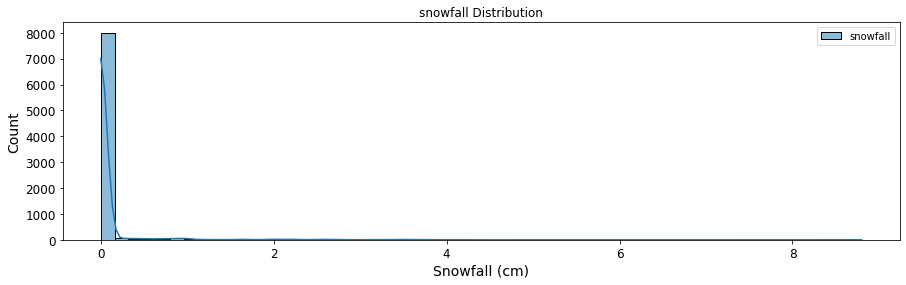

In [50]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df_clean, x= 'Snowfall (cm)', bins=55, kde=True, label="snowfall")
plt.title("snowfall Distribution")
plt.legend()
plt.show();
scatterbox(df_clean.index, df_clean['Snowfall (cm)'],'Snowfall (cm)','Snowfall (cm)', "Total data")

**Distribution analysis**

- From the above Snowfall distribution we can see that the distribution follows the left skewed. 
- Values in the distribution is much denser in left side compared to right side.


**Outlier analysis**
- From the outlier analysis we can see that, there are lot of outliers above the upper boundry level.
- Above the whisker level of box plot are values above the upper boundry level, and we will consider these values as the outlier in the data.
- However, we will remove the outlier only if the Rainfall feature important for this prental bike demand prediction.

#### Seasons

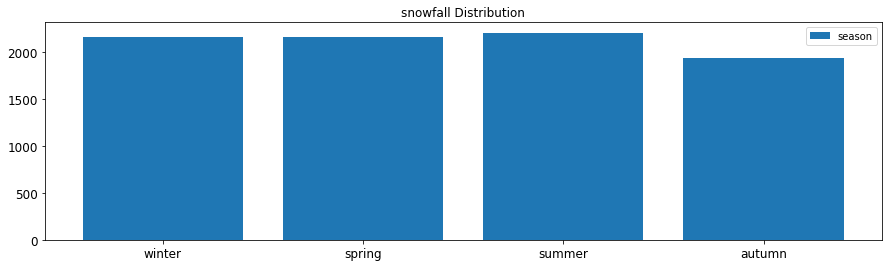

In [51]:
samples_ = [df_clean[df_clean["Winter"]==1].shape[0], df_clean[df_clean["Spring"]==1].shape[0],
            df_clean[df_clean["Summer"]==1].shape[0], df_clean[df_clean["Autumn"]==1].shape[0]]
seasons = ["winter", "spring", "summer", "autumn"]
plt.figure(figsize=(15, 4))
plt.bar(seasons, samples_, label="season")
plt.title("snowfall Distribution")
plt.legend()
plt.show();

**Distribution analysis**

- From the above distribution we can see that all the season has uniform amount of values and follows the uniform distribution

#### Holiday

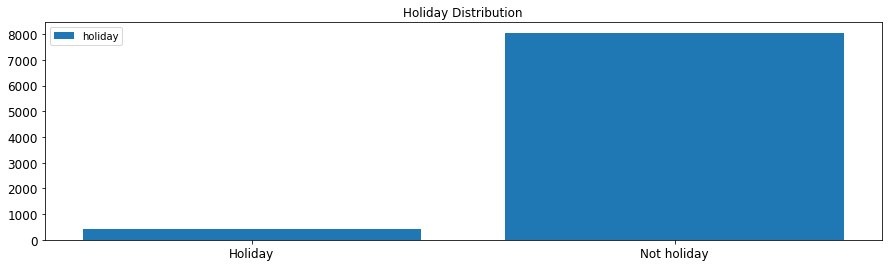

In [52]:
samples_h = [df_clean[df_clean["Holiday"]==0].shape[0], df_clean[df_clean["Holiday"]==1].shape[0]]
holiday_ = ["Holiday", "Not holiday"]
plt.figure(figsize=(15, 4))
plt.bar(holiday_, samples_h, label="holiday")
plt.title("Holiday Distribution")
plt.legend()
plt.show();

**Distribution analysis**

- From the above distribution we can see that, there are less number of data in Holiday comapred to the Not Holiday.
- We will make a further analysis to see if the Holiday feature play important role in bike rental demand.

### <font color="red">Summary on problemetic entries</font>
- **Humidity value has the 3 negative values and 1 above the 100% values**, from the domain knowledge we know that value of humidity is within the 0 to 100%. 

- **Temperature has 1 value that is 306 C**, and this value has high Z score value of 24 and we are considering this value as problemtic.

- **Windspeed has value of 2000 m/s** and this value has  z score of 24 and we will consider this the outlier.

- **Visiblity value has the negative value of -678** and this is the only one value away from all the value therefore we will consider this value as probelemtic.

- However, we did find ouit that Rianfalla dn snowfall has quite lot of outlier, however, we will only remove them if the feature is important in the model.

### 2.2 Imputation and Pre-Processing

<font color ="green">**Set any problematic values** in the numerical data to `np.nan` and check that this has worked. Once this is done, specify a **sklearn *pipeline* that will perform imputation** to replace problematic entries (nan values) with an appropriate **median** value ***and* any other pre-processing** that you think should be used. Just specify the pipeline - do ***not*** run it now.</font>

From the above Univariate distribution and outlier analysis we found that there are problemtic entries in **Humidity, Temperature, Wind speed and Visiblity.**

**Problemtic entries in Humidity are as follows**

In [55]:
df_prob = df_clean.copy()

In [56]:
# Datsets when humidity < 0 

df_prob[df_prob["Humidity (%)"]<0]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
3111,1,1038,15,14.2,-24,1.8,1743,-6.1,2.60,0.0,0.0,1,0,1,0,0
3112,1,1185,16,15.3,-24,1.5,1534,-5.1,2.00,0.0,0.0,1,0,1,0,0
3113,1,1479,17,15.3,-26,0.9,1257,-4.1,1.39,0.0,0.0,1,0,1,0,0


In [57]:
# Datasets when Humidity > 100 %
df_prob[df_prob["Humidity (%)"]>100]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
1030,1,186,22,-6.9,309,1.6,2000,-18.5,0.0,0.0,0.0,1,1,0,0,0


**We will convert these humidity value as np.nan**

In [58]:
index_problemtic_humidity = list(df_prob[df_prob["Humidity (%)"]<0].index)+list(df_prob[df_prob["Humidity (%)"]>100].index)
df_prob["Humidity (%)"].loc[index_problemtic_humidity] = np.nan 
df_prob.loc[index_problemtic_humidity]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
3111,1,1038,15,14.2,NaN,1.8,1743,-6.1,2.60,0.0,0.0,1,0,1,0,0
3112,1,1185,16,15.3,NaN,1.5,1534,-5.1,2.00,0.0,0.0,1,0,1,0,0
3113,1,1479,17,15.3,NaN,0.9,1257,-4.1,1.39,0.0,0.0,1,0,1,0,0
1030,1,186,22,-6.9,NaN,1.6,2000,-18.5,0.00,0.0,0.0,1,1,0,0,0


We can see that, the both negative values and above 100% are now changed to np.nan values

**Problemtic entries in Temperature**

In [59]:
# Temperature > 300 C

df_prob[df_prob["Temperature (C)"]>300]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
6201,1,876,9,306.0,55.0,1.1,2000,20.5,1.46,0.0,0.0,1,0,0,1,0


In [60]:
index_problemtic_temperature = df_prob[df_prob["Temperature (C)"]>300].index
df_prob["Temperature (C)"].loc[index_problemtic_temperature] = np.nan 
df_prob.loc[index_problemtic_temperature]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
6201,1,876,9,NaN,55.0,1.1,2000,20.5,1.46,0.0,0.0,1,0,0,1,0


We can see that the temperature values are now chnaged to np.nan

In [61]:
# Windspeed == 2000 m/s

df_prob[df_prob["Wind speed (m/s)"]>=2000]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
7482,1,2787,18,18.1,39.0,2000.0,1,3.9,0.21,0.0,0.0,1,0,0,0,1


In [62]:
index_problemtic_windspeed = df_prob[df_prob["Wind speed (m/s)"]>=2000].index
df_prob["Wind speed (m/s)"].loc[index_problemtic_windspeed] = np.nan 
df_prob.loc[index_problemtic_windspeed]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
7482,1,2787,18,18.1,39.0,NaN,1,3.9,0.21,0.0,0.0,1,0,0,0,1


Windspeed value with 2000 m/s is now changed to np.nan

In [63]:
# Visiblity -678

df_prob[df_prob["Visibility (10m)"]<0]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
5523,1,393,3,24.4,85.0,0.6,-678,21.7,0.0,0.0,0.0,1,0,0,1,0


In [64]:
index_problemtic_visiblity = df_prob[df_prob["Visibility (10m)"]<0].index
df_prob["Visibility (10m)"].loc[index_problemtic_visiblity] = np.nan 
df_prob.loc[index_problemtic_visiblity]

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Winter,Spring,Summer,Autumn
5523,1,393,3,24.4,85.0,0.6,NaN,21.7,0.0,0.0,0.0,1,0,0,1,0


<font color="red">**Creating the pipeline for preprocessing**</font>
- Preprocessing pipeline includes Impuation using SimpleImputer from sklearn
- Standard Scaler from sklearn for scaling

In [66]:
# preprocessing pipeline
preprocess_pipeline = Pipeline([('imputation', SimpleImputer(missing_values=np.nan,
                                                           strategy="median"))])

In [67]:
# Adding the scaling pre-process in the pipeline

preprocess_pipeline.steps.append([("Scaler - Standard", StandardScaler())])

From the above code,

-  We have chnaged the value of problemetic entries into np.nan values.
- Since, nan values need to change back to numeric values, we can use sklearn's pipeline that is SimpleImputer
- SimpleImputer has different strategies to mitigate the nan values such as filling the nan values with mean, median and mode.
- We need to do the scaling of the values 

### 2.3 Correlation 

<font color ="green">It is also useful to look at how strongly correlated the features are to the desired target (Rented Bike Count). Before anything else is done it is necessary to **fit and apply the pipeline** above to make a *temporary* version of the whole dataset that is pre-processed. **Why is it important to not use this version of the pre-processed data again?**</font>

<font color="red">**Preprocessing the data by imputing the np.nan values with the median of the feature**</font>

In [69]:
preprocess_pipeline[0]

SimpleImputer(strategy='median')

In [68]:
# Converting the np.nan to median of the feature
impute_median = preprocess_pipeline[0].fit_transform(df_prob)

#creating the dataframe for numpy output from the imputing
df_prob_impute = pd.DataFrame(data=impute_median, columns=df_prob.columns)

In [70]:
# checking if there are any nan values
df_prob_impute.isna().sum(axis=0)

Date                         0
Rented Bike Count            0
Hour                         0
Temperature (C)              0
Humidity (%)                 0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature (C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Holiday                      0
Winter                       0
Spring                       0
Summer                       0
Autumn                       0
dtype: int64

From the above transformation after imputing the np.nan values with the median value of the feature there are no np.nan values availbale in the dataset.

<font color="red">**Why is it important to not use this version of the pre-processed data again?**</font>

- It is not advisable to use the above preprocessed data again for the modeling because, when we performed the impuatation we used median as a strategy and this median value can be from the test data as well. Therefore by using this data we are peaking into the unseen data.

- By doing peaking, we are training our model to the unseen data and hence when the new data comes, our model will suffer and it might overfit.

- Therefore, we will not use the above preprocessed data for further analysis.

In [72]:
# ordering the columns so, target values are at the last
cols_orderd = ['Date', 'Hour', 'Temperature (C)', 'Humidity (%)', 'Wind speed (m/s)', 'Visibility (10m)', 
               'Dew point temperature (C)','Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
               'Winter', 'Spring', 'Summer', 'Autumn','Rented Bike Count']
df_prob_impute = df_prob_impute[cols_orderd]

 <font color="green">To visualise the strength of the relationships, display a **scatter plot** for each feature (separately) vs the target variable.  Also **calculate the correlation** of each feature with the target (Hint: pandas function `corr()` or numpy `corrcoef()`). **Which 3 attributes are the most correlated with bike rentals?**</font>

**Correlation**

<font color="red">**Correlation as a heatmap**</font>

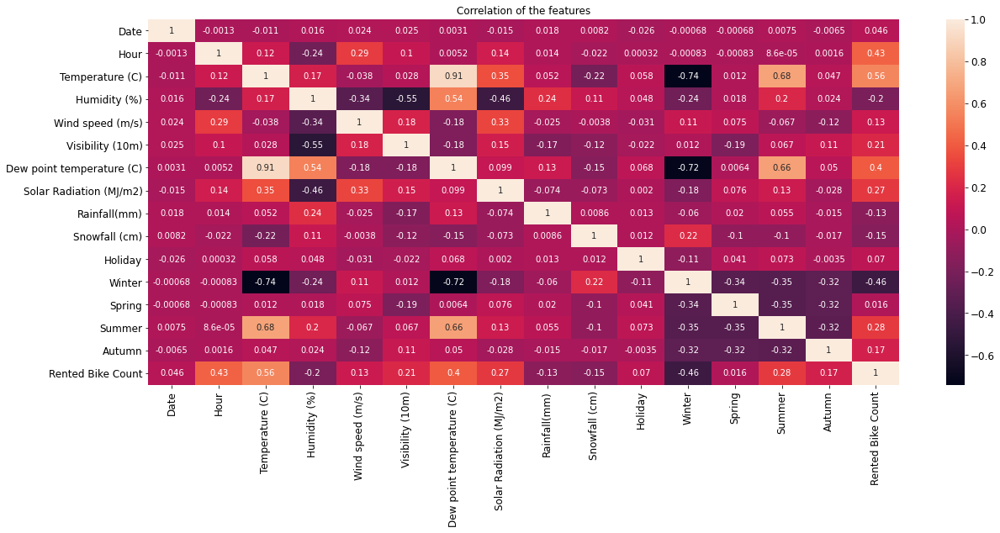

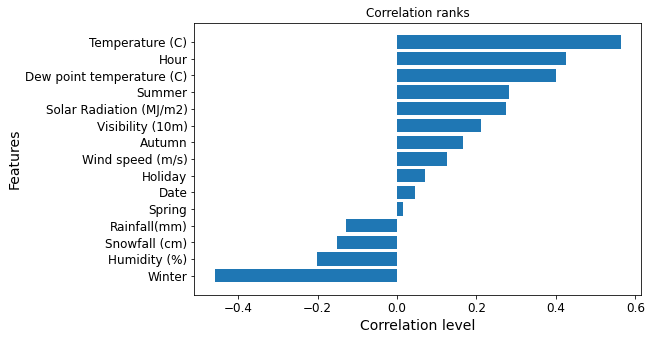

In [73]:
corr_ = df_prob_impute.corr() 
plt.figure(figsize=(20,8))
sns.heatmap(corr_, annot=True)
plt.title("Correlation of the features")
plt.show()

corr_feat = corr_.index[:-1]
corr_values = corr_.iloc[:-1, -1]
corr_rank = pd.DataFrame(data=list(corr_values), index=corr_feat, columns=["Features"])
corr_rank = corr_rank.sort_values(by="Features", ascending=False)
plt.figure(figsize=(8,5))
plt.barh(y=corr_rank.index[::-1], width=list(corr_rank["Features"])[::-1])
plt.title("Correlation ranks")
plt.ylabel("Features")
plt.xlabel("Correlation level")
plt.show()

- <u>From the above plot we can see that correlation of features with respect to the target.</u>
- **The top 3 correlation features are as follows:**
    - Temperature (C)
    - Hour
    - Dew Point temperature (C) 
    
- However, here correlation is not just depends on positive, because  we have both positive correlation and negative correlation.

- All the diagonal values are 100% correlated because they are correlating with themselves.
- Our target data is "Rented Bike count" and from the heatmap we can observe that both positively and negatively corelation.
    - **Positive correlation (Highest to lowest)**
        - Temperature (c)
        - Hour
        - Dew point temperature
        - Summer 
        - Solar radiation
        - Visiblity
        - Autumn
        - Wind speed
        
    - **Negative correlation (Highest to lowest)**
        - Winter
        - Humidity
        - Snowfall
        - Rainfall
        
    - **No correation (Very small correlation)**
        - Date with 0.046 %
        - Holiday with 0.07 % 
        - Spring with 0.016%
        
- We can see very intresting fact that, whenever there is a holiday the rental bike has no correlation with the demand.

### Bi variate analysis

- In bivariate analysis, we are analysing the each feature with respect to the taregt data.

**Rental bikde demand on season basis**

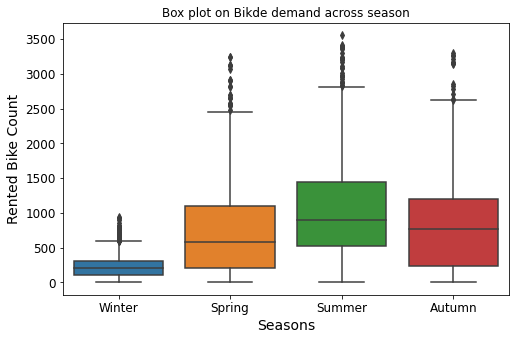

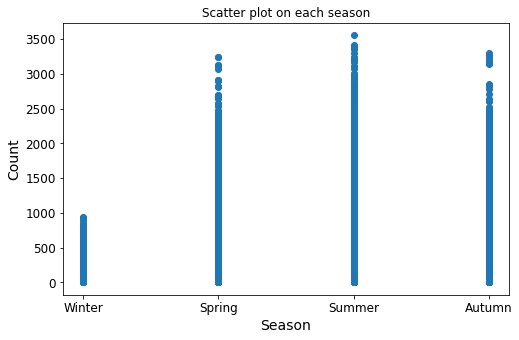

In [74]:
# Box plot on season and bikd demand

plt.figure(figsize=(8,5))
sns.boxplot(x="Seasons", y="Rented Bike Count", data=df)
plt.title("Box plot on Bikde demand across season")
plt.show();


plt.figure(figsize=(8,5))
plt.scatter(df["Seasons"], df["Rented Bike Count"])
plt.title("Scatter plot on each season")
plt.xlabel("Season")
plt.ylabel("Count")
plt.show();

**<font color="red">Inference</font>**

- From the above analysis, we can see that there is lot of bike demand during the summer, and followed by spring and autumn season. Hence, we can say that seasons like summer, spring and autumn has some dependency on demand of bikes. However, Winter has the very low demand comapred to all the other season. Hence, we can use this information for rebalacing bike stock during the each season.

- We can also see that Summer has 0.282 that 28.2% of correlation with respect to the demand on bikes from the given data. That is, increase in bike demand during summer season.

- Whereas, Winter has the -0.45 correlation that -45% of correlation. which implies that there is negative correlation of demand in bike during the Winter. That is decrease in bike demand during the winter season.

**Hourly analysis of demand in bikes**

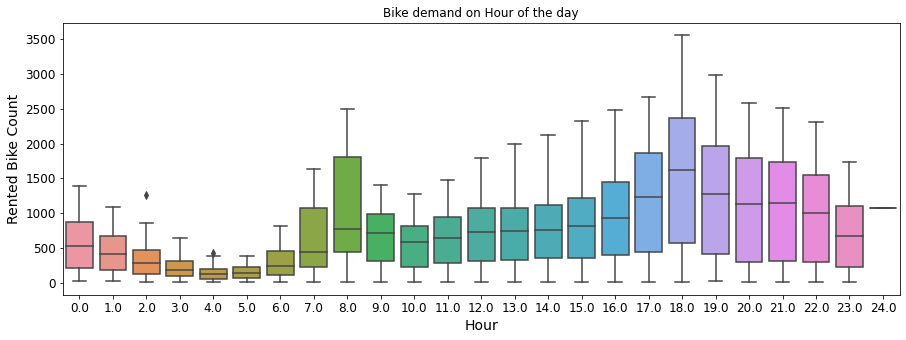

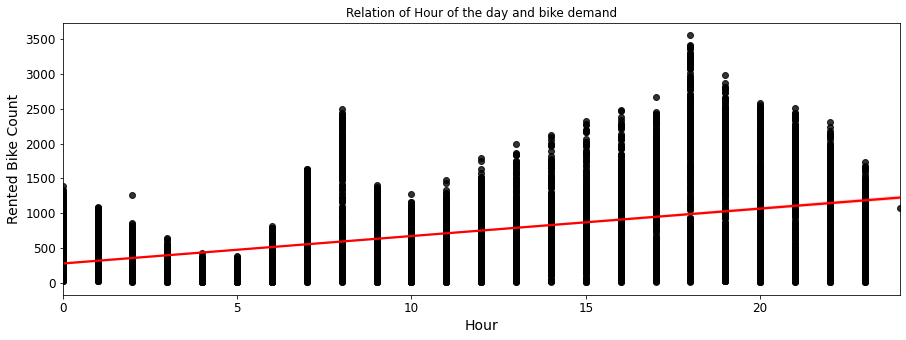

In [75]:
plt.figure(figsize=(15, 5))
sns.boxplot(x="Hour", y="Rented Bike Count", data=df_prob_impute)
plt.title("Bike demand on Hour of the day")
plt.show();

plt.figure(figsize=(15,5))
sns.regplot(x="Hour", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'black'},
            line_kws={'color':'red'})
plt.title("Relation of Hour of the day and bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above relation based analysis plot we can say that,
    - Hourly is linearly related to the demand in bikes.
    - As the hour passes from morning to evevning the demand in bike is increasing steadily. However, after 10:00PM to 11:00PM the demand in bikes decreases and there is a flat rate during the early morning from 12:00AM to 6:00AM.
    - Most peak hour for bike demand is during 10:00AM to 10:00PM.

**Working day analysis**

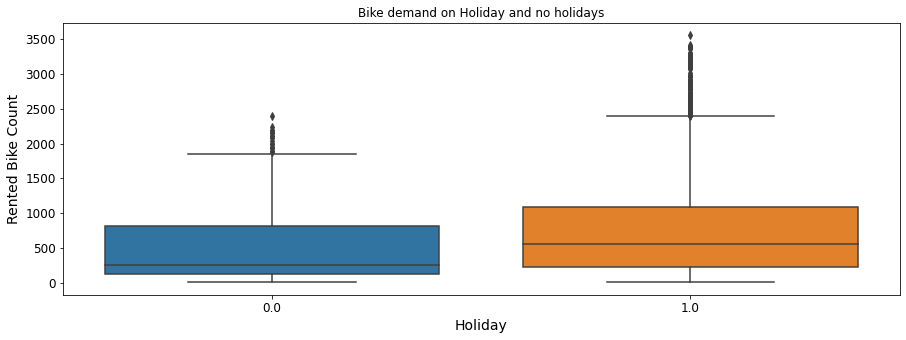

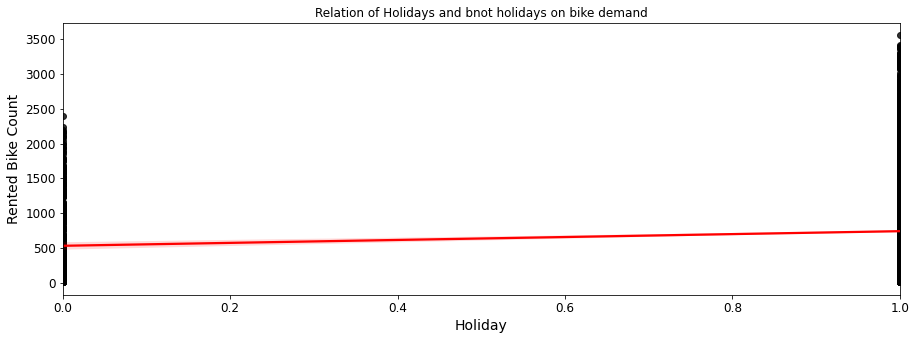

In [76]:
# No holiday - 1, holiday - 0
plt.figure(figsize=(15, 5))
sns.boxplot(x="Holiday", y="Rented Bike Count", data=df_prob_impute)
plt.title("Bike demand on Holiday and no holidays")
plt.show();

plt.figure(figsize=(15,5))
sns.regplot(x="Holiday", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'black'},
            line_kws={'color':'red'})
plt.title("Relation of Holidays and bnot holidays on bike demand")
plt.show()

**<font color ="red">Inference</font>**

- From the above plot we can say that,
    - Demand in bike has no such relation with being holiday  because from the box plot we can see that they are in flat rate. Furthermore, correlation of holiday with respect to bike demand is 0.07%. 
    - From the above plot we can see that having no holiday influences the demand in bike compared to having holiday.

**Relation of day of the week on bike demand**

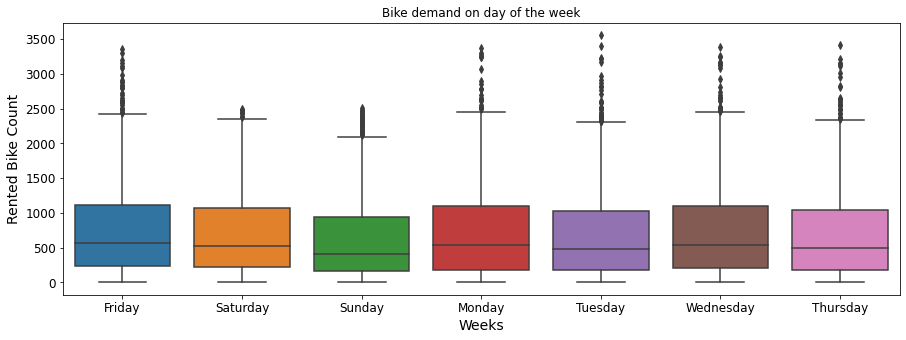

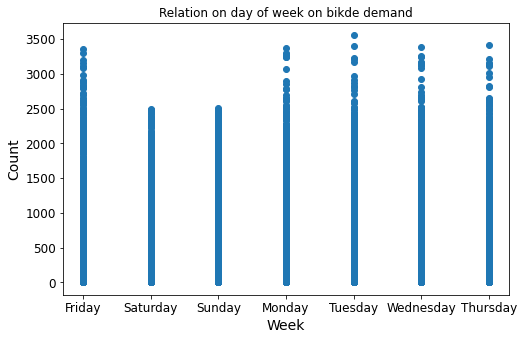

In [77]:
df_week = df.copy()
all_weekdays = [datetime.datetime.strptime(x, '%d/%m/%Y').strftime('%A') for x in df_week["Date"]]
df_week["Weeks"] = all_weekdays
plt.figure(figsize=(15, 5))
sns.boxplot(x="Weeks", y="Rented Bike Count", data=df_week)
plt.title("Bike demand on day of the week")
plt.show();

plt.figure(figsize=(8,5))
plt.scatter(df_week["Weeks"], df["Rented Bike Count"])
plt.title("Relation on day of week on bikde demand")
plt.xlabel("Week")
plt.ylabel("Count")
plt.show();

**<font color="red">Inference</font>**

- From the above plot on relation of day of week to bike demand can be interpreted as,
    - There is a high demand in bikes during the weekdays compared to the weekend (Saturday and Sunday)

**Relation temperature on demand of bikes**

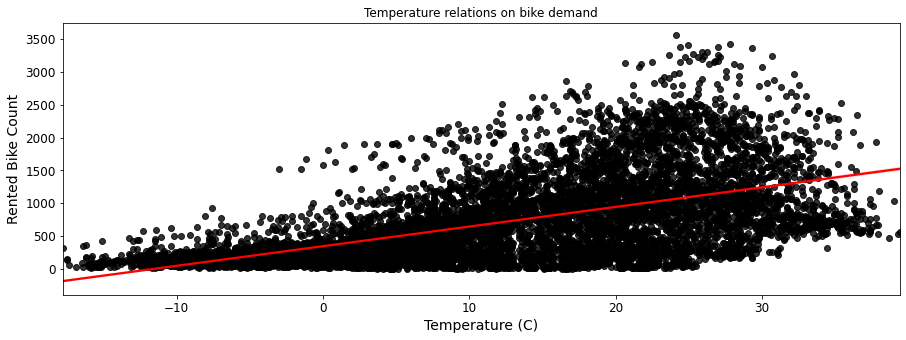

In [79]:
plt.figure(figsize=(15,5))
sns.regplot(x="Temperature (C)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'black'},
            line_kws={'color':'red'})
plt.title("Temperature relations on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of temperature on bike demand can be interpreted as,
    - Increase in temperature and demand in bike has a linear relation, and the relation here is positive correlated, and they have high correlation value of 56%.
    - From the regression plot we can see that straight line fit is in linear relation with the temperature.
    - Here positive relatiion means that, as the temperature is increasing thedemand in bike is increasing

**Relation humidity on demand of bikes**

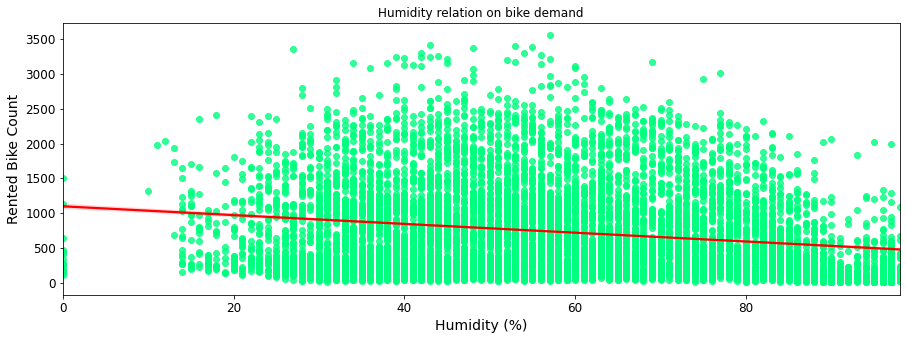

In [81]:
plt.figure(figsize=(15,5))
sns.regplot(x="Humidity (%)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'springgreen'},
            line_kws={'color':'red'})
plt.title("Humidity relation on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of humidity on bike demand can be interpreted as,
    - Increase in humidity and demand in bike has a linear relation, however, they are in negative correlation with respect to each other hence they have high negative correlation value of 56%.
    - From the regression plot we can see that straight line fit is in linear relation with the humidity.
    - Here negative correlalation implies that as the humidity is increasing the demand in bike is decreasing.

**Relation dew point temperature on demand of bikes**

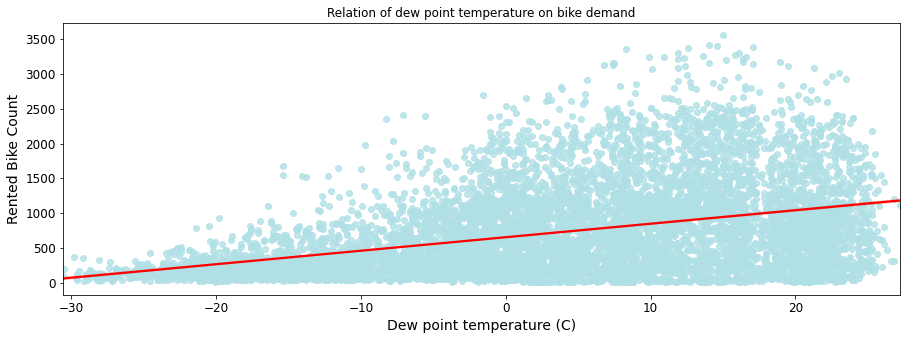

In [82]:
plt.figure(figsize=(15,5))
sns.regplot(x="Dew point temperature (C)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'powderblue'},
            line_kws={'color':'red'})
plt.title("Relation of dew point temperature on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of dew point temperature on bike demand can be interpreted as,
    - Increase in dew point temperature and demand in bike has a linear relation, however, they are in positive correlation with respect to each other hence they have high positive correlation value of 40%.
    - From the regression plot we can see that straight line fit is in linear relation with the dew point temperature.
    - Here positive correlalation implies that as the dew point temperature is increasing the demand in bike is increasing.

**Relation Soalr radition on demand of bikes**

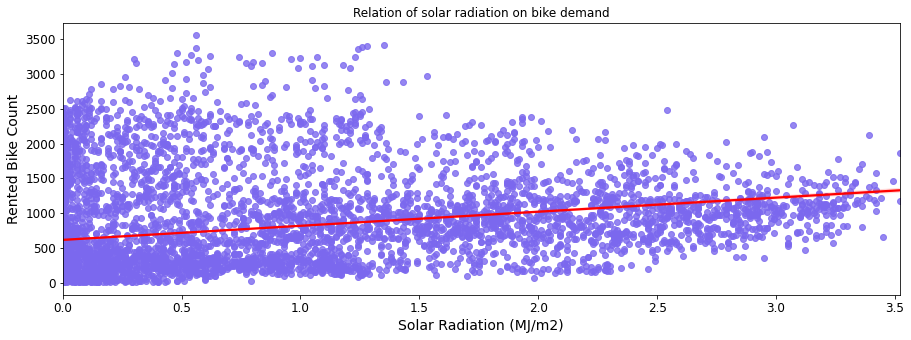

In [83]:
plt.figure(figsize=(15,5))
sns.regplot(x="Solar Radiation (MJ/m2)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'mediumslateblue'},
            line_kws={'color':'red'})
plt.title("Relation of solar radiation on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of solar radiation on bike demand can be interpreted as,
    - Increase in solar radition and demand in bike has a linear relation, however, they are in positive correlation with respect to each other. But the relation of two variable is not that good as temperature, futhermore, they have a positive correlation value of 27%.
    - From the regression plot we can see that straight line fit is in linear relation with the solar radiation.
    - Here positive correlalation implies that as the solar radiation is increasing the demand in bike is increasing.

**Relation wind speed on demand of bikes**

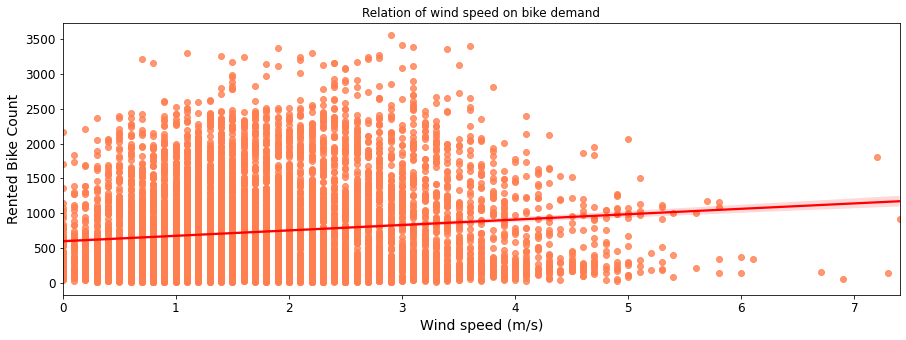

In [84]:
plt.figure(figsize=(15,5))
sns.regplot(x="Wind speed (m/s)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'coral'},
            line_kws={'color':'red'})
plt.title("Relation of wind speed on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of wind speed on bike demand can be interpreted as,
    - Increase in wind speed and demand in bike has a linear relation, however, they are in positive correlation with respect to each other. But the relation of two variable is not that good as temperature, futhermore, they have a positive correlation value of 12.5%.
    - From the regression plot we can see that straight line fit is in linear relation with the wind speed.
    - Here positive correlalation implies that as the wind speed is increasing the demand in bike is increasing.

**Relation Visiblity on demand of bikes**

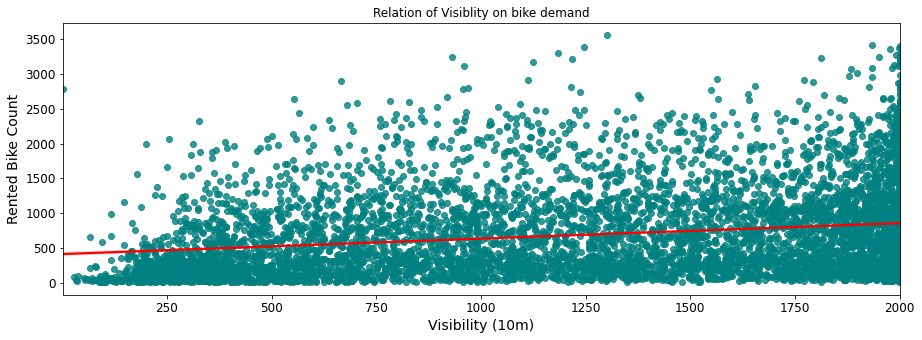

In [85]:
plt.figure(figsize=(15,5))
sns.regplot(x="Visibility (10m)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'teal'},
            line_kws={'color':'red'})
plt.title("Relation of Visiblity on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of visiblity on bike demand can be interpreted as,
    - Increase in visiblity and demand in bike has a linear relation, however, they are in positive correlation with respect to each other. Futhermore, they have a positive correlation value of 21%.
    - From the regression plot we can see that straight line fit is in linear relation with the visiblity.
    - Here positive correlalation implies that as the visiblity is increasing the demand in bike is increasing.

**Relation Rainfall on demand of bikes**

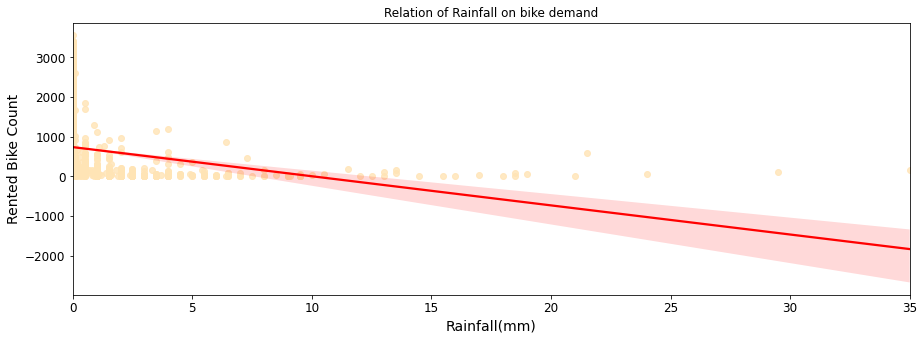

In [86]:
plt.figure(figsize=(15,5))
sns.regplot(x="Rainfall(mm)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'moccasin'},
            line_kws={'color':'red'})
plt.title("Relation of Rainfall on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of rainfall on bike demand can be interpreted as,
    - Increase in rainfall and demand in bike has a linear relation, however, they are in negative correlation with respect to each other. But the relation of two variable is not that good as humidity, futhermore, they have a negative correlation value of 12%.
    - From the regression plot we can see that straight line fit is in linear relation with the rainfall.
    - Here negative correlalation implies that as the rainfall is increasing the demand in bike is decareasing.

**Relation temperature on demand of bikes**

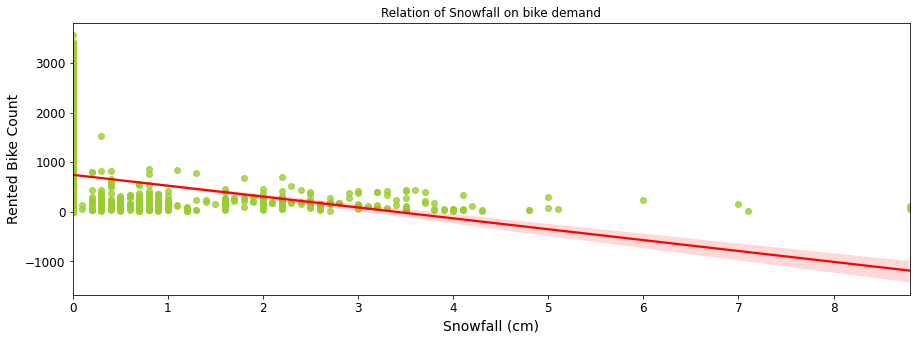

In [87]:
plt.figure(figsize=(15,5))
sns.regplot(x="Snowfall (cm)", y="Rented Bike Count", data=df_prob_impute, scatter_kws={'color':'yellowgreen'},
            line_kws={'color':'red'})
plt.title("Relation of Snowfall on bike demand")
plt.show()

**<font color="red">Inference</font>**

- From the above plot on relation of snowfall on bike demand can be interpreted as,
    - Increase in snowfall and demand in bike has a linear relation, however, they are in negative correlation with respect to each other. But the relation of two variable is not that good as humidity, but better than the rainfall futhermore, they have a negative correlation value of 15%.
    - From the regression plot we can see that straight line fit is in linear relation with the snowfall.
    - Here negative correlalation implies that as the snowfall is increasing the demand in bike is decareasing.

## Step 3: Predicting bike rentals (25%)

<font color="green">A regression approach will be used for this problem: that is, "bike rentals" will be treated as a real number whose value will be predicted. If necessary, it could be rounded to the nearest integer afterwards, but this will not be necessary here. The root mean squared error (rmse) metric will be used to quantify performance.  

**Split the data** appropriately so that 20% of it will be kept as a hold-out test set. **Build a pipeline** starting with the one specified in section 2.2 above, and now include a ***linear regression* model**. After you've done this, **fit** this to your training data for a quick test. To get an idea of how successful this model is, **calculate the rmse of the fit to the training data**. To act as a simple baseline for comparison, **also calculate the rmse** that you would get if all the predictions were equal to the **mean of the training targets** (i.e. bike rentals).</font>


**<font color="red">Before any further analysis we need to use the proper data that is, we cannot use the older data because there is a mixing situation because of imopuation**</font>

* Steps for transforming the data:
- Step 1: Using the old data with np.nan
- Step 2: Dividing the data into train and development data
- Step 3: Fitting the imputation on training data using SimpleImputer
- Step 4: Using the same transformation from train on developmenmt data.

In [90]:
# using the df_clean data before the impuation (Using the old data with np.nan)

df_clean.isna().sum(axis=0)

Date                          0
Rented Bike Count             0
Hour                          0
Temperature (C)               0
Humidity (%)                  0
Wind speed (m/s)              1
Visibility (10m)              0
Dew point temperature (C)     1
Solar Radiation (MJ/m2)       0
Rainfall(mm)                 25
Snowfall (cm)                23
Holiday                       0
Winter                        0
Spring                        0
Summer                        0
Autumn                        0
dtype: int64

From the above data we can confirm that we are using the old data. without any impuatation.

**Splitting the data into train and developement set by 80% and 20%**

- Train dataset will be further divided into train and validation set for any further analysis

- Development set will be used as hold out test set for the testing data (used at the very end)

In [92]:
# Splitting the data into train and developement set by 80 and 20%
# Dividing the data into train and development data
trainset_c, devset_c = train_test_split(df_clean, test_size=0.2,shuffle=True, random_state=53)

In [107]:
#Fitting the imputation on training data using SimpleImputer
trainimput = preprocess_pipeline.steps[0][1].fit(trainset_c)
#Using the same transformation from train on developmenmt data.
trainset = trainimput.transform(trainset_c)
devset = trainimput.transform(devset_c)

In [112]:
trainset = pd.DataFrame(data=trainset, columns=df_clean.columns)
devset = pd.DataFrame(data=devset, columns=df_clean.columns)

**Building the pipeline for linear regresison**
-  Here, we create the pipeline for linear regression

In [113]:
#Building the pipeline

linear_pipeline = Pipeline([('Linear Regression Model', LinearRegression())])

**Fitting the train data to the linear regression model**

- Dividing the train dataset into train and validation set
- Calculating the rmse on validation set using train data for fiitting
- Calculating the rmse on train data by using train data as fitting (underfit testing)
- Calculating the rmse using the mean of the validation data and comapring with the actual values of the validation data 

In [114]:
# Dividing the train dataset into train and validation set


trainset = trainset[['Date','Hour', 'Temperature (C)', 'Humidity (%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature (C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
       'Winter', 'Spring', 'Summer', 'Autumn','Rented Bike Count']]
X_t = trainset.iloc[:, :-1].values
Y_t = trainset.iloc[:, -1].values
xtrain, xvalid, ytrain, yvalid = train_test_split(X_t, Y_t, test_size=0.2, shuffle=True, 
                                               random_state=53)

**Using the train data and validation data for baseline and calculating the rmse**
- Step 1: Use the train data from after dividing the data into train and validation data
- Step 2: Fit the train data to the regression model
- Step 3: Use the validation data for predicting
- Step 4: Calculate the RMSE with respect to actual validation target and predicted validation data

In [115]:
# Using the train data for baseline and calculating the rmse
reg_linear = linear_pipeline['Linear Regression Model'].fit(xtrain, ytrain)
pred_linear = reg_linear.predict(xvalid)
rmse_linear_valid = np.sqrt(mean_squared_error(yvalid, pred_linear))

**Using the train data for baseline and calculating the rmse**
- Step 1: Fit the regression model using the train data
- Step 2: Predict the model using train data itself (Test for underfitting)
- Step 3: Calculate the RMSE with respect to actual train target and predicted train data

In [116]:
# Using the train data for baseline as test
pred_train_linear = reg_linear.predict(xtrain)
rmse_linear_train = np.sqrt(mean_squared_error(ytrain, pred_train_linear))

**Using the mean target data (validation) for baseline and calculating the rmse**
- Step 1: Calculate the mean of the validation 
- Step 2: Calculate the RMSE with respect to actual validation target and mean of the validation data

In [117]:
# Using mean of the target(valid) as baseline
mean_target_valid = [np.mean(yvalid)]*len(yvalid)
rmse_linear_mean_valid = np.sqrt(mean_squared_error(yvalid, mean_target_valid))

**Using the mean target data (train data) for baseline and calculating the rmse**
- Step 1: Calculate the mean of the train data 
- Step 2: Calculate the RMSE with respect to actual training target and mean of the train data

In [118]:
# Using mean of the target(train) as baseline
mean_target_train = [np.mean(ytrain)]*len(ytrain)
rmse_linear_mean_train = np.sqrt(mean_squared_error(ytrain, mean_target_train))

In [120]:
print("RMSE of Train data: Train data and Prediction data:validation data: ", 
      np.round(rmse_linear_valid, 2))
print("RMSE of Train data: Train data and Prediction data: Train data: ", 
      np.round(rmse_linear_train , 2))
print("RMSE of Mean data:Validation data and Prediction data:Validation data ", 
      np.round(rmse_linear_mean_valid, 2))
print("RMSE of Mean data:train data and Prediction data:train data ", 
      np.round(rmse_linear_mean_train, 2))

RMSE of Train data: Train data and Prediction data:validation data:  426.28
RMSE of Train data: Train data and Prediction data: Train data:  443.43
RMSE of Mean data:Validation data and Prediction data:Validation data  640.09
RMSE of Mean data:train data and Prediction data:train data  651.25


<font color="green">Show an appropriate **visualisation of the fit for your linear regression.**</font>

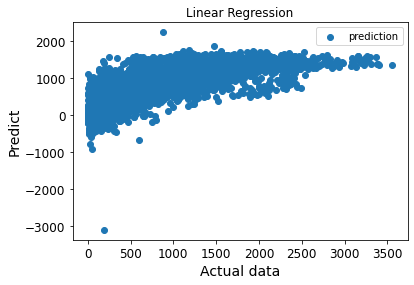

In [137]:
plt.scatter(ytrain, pred_train_linear, label="prediction")
plt.title("Linear Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- From the above prediction using linear regression we can see that the prediction are densed closely and has the high rmse comapring any other two method. Therefore we can use this model as the baseline.

<font color="green">Now two other, different regression models (that you probably won't be familiar with) will be fit and later these will be compared to find the best one.

The second model to fit is ***Kernel Ridge*** regression (`from sklearn.kernel_ridge import KernelRidge`). **Build a pipeline using this and fit it to your training data**, using the default settings. Again, **plot the fit and display the rmse for the training dataset.**</font>

<font color="green">The third, and most powerful model, is ***Support Vector Regression*** (`from sklearn.svm import SVR`). **Build a pipeline using this and fit it to your training data**, using the default settings. Again, **plot the fit and display the rmse for the training dataset.**</font>

At this step we have to way of doing the analysis:
- **Using the variable improtance to remove the unwanted features**
- **Using the all feature without variable importance**


**<font color="red">Method 1: We will answer the question without considering the variable importance method</font>**

In [133]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR

In [135]:
# sclaing the data X and Y on train and applying the same transformation on validation data
trainset_clean_wvi = trainset.copy() 
Xclean_wvi, Yclean_wvi = trainset_clean_wvi.iloc[:, :-1].values, trainset_clean_wvi.iloc[:, -1].values
xtrain_clean_wvi, xvalid_clean_wvi, ytrain_clean_wvi, yvalid_clean_wvi = train_test_split(Xclean_wvi,
                                                                         Yclean_wvi, test_size=0.2,
                                                                         shuffle=True, random_state=53)
# scaling on X data
Xscaler_wvi = preprocess_pipeline.steps[1][0][1].fit(xtrain_clean_wvi)
Xtrain_scaled_wvi = Xscaler_wvi.transform(xtrain_clean_wvi) 
Xvalid_scaled_wvi = Xscaler_wvi.transform(xvalid_clean_wvi) 

# Scaling on Y data
Yscaler_wvi = preprocess_pipeline.steps[1][0][1].fit(ytrain_clean_wvi.reshape(-1,1))
Ytrain_scaled_wvi = Yscaler_wvi.transform(ytrain_clean_wvi.reshape(-1,1))
Yvalid_scaled_wvi = Yscaler_wvi.transform(yvalid_clean_wvi.reshape(-1,1))

 <font color = "green">The second model to fit is ***Kernel Ridge*** regression (`from sklearn.kernel_ridge import KernelRidge`) **Build a pipeline using this and fit it to your training data**, using the default settings. Again, **plot the fit and display the rmse for the training dataset.**</font>

RMSE of the Kernel ridge regression is:  426.27755935011817
R2 score of the Kernel ridge regression is:  55.65


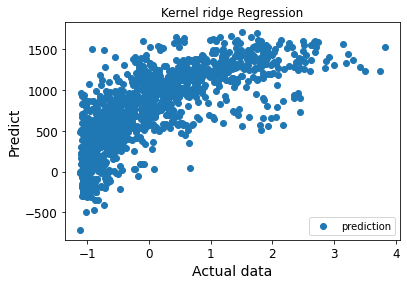

In [138]:
Kernelridge_pipeline = Pipeline(steps=[('Kernel ridge', KernelRidge())])
kreg_wvi = Kernelridge_pipeline["Kernel ridge"].fit(Xtrain_scaled_wvi, Ytrain_scaled_wvi)
predict_kreg_wvi = kreg_wvi.predict(Xvalid_scaled_wvi)
pred_kreg_wvi_inverse = Yscaler_wvi.inverse_transform(predict_kreg_wvi.reshape(-1,1))
print("RMSE of the Kernel ridge regression is: ",
     np.sqrt(mean_squared_error(yvalid_clean_wvi, pred_kreg_wvi_inverse)))
print("R2 score of the Kernel ridge regression is: ",
     round(r2_score(yvalid_clean_wvi, pred_kreg_wvi_inverse)*100,2))

plt.scatter(Yvalid_scaled_wvi, pred_kreg_wvi_inverse, label="prediction")
plt.title("Kernel ridge Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- From the above prediction we cans see that model prediction is in relation with the actual data.
- Performace of the linear regressioin and kernel regression is almost similar, but kernel ridge has less RMSE comapred to linear regresison

<font color="green">The third, and most powerful model, is ***Support Vector Regression*** (`from sklearn.svm import SVR`). **Build a pipeline using this and fit it to your training data**, using the default settings. Again, **plot the fit and display the rmse for the training dataset.**</font>

RMSE of the SVR regression is:  316.18012682845773
R2 score of the SVR regression is:  75.6


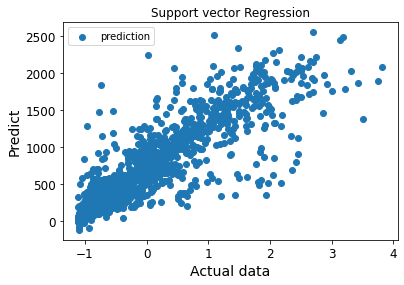

In [140]:
svr_pipeline = Pipeline(steps=[('SVR', SVR())])
svr_wvi = svr_pipeline["SVR"].fit(Xtrain_scaled_wvi, Ytrain_scaled_wvi.ravel())
predict_svr_wvi = svr_wvi.predict(Xvalid_scaled_wvi)
pred_svr_wvi_inverse = Yscaler_wvi.inverse_transform(predict_svr_wvi.reshape(-1,1))
print("RMSE of the SVR regression is: ",
     np.sqrt(mean_squared_error(yvalid_clean_wvi, pred_svr_wvi_inverse.ravel())))
print("R2 score of the SVR regression is: ",
     round(r2_score(yvalid_clean_wvi, pred_svr_wvi_inverse.ravel())*100,2))

plt.scatter(Yvalid_scaled_wvi, pred_svr_wvi_inverse, label="prediction")
plt.title("Support vector Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- From the above prediction by Support vector regresision we can see that the predictions are far better than previous 2 models.
- They have linear relation with the prediction which also means that they have good fit.

**Overall, Support vector regresison is better than the kernel ridge regression and linear regression and has better rmse than the baseline model**

**<font color="red">Method 2: Using variable importance for identifying best feature</font>**

### Variable Importance

**Multicollineariy check**

- For any regressioin model, we need to check the multicollinearity issues.
- Multicollineariy will check if the independent features are related to each other. If these  features are somehow related then there is a multicollineariy issue. Because we are trying to learn the target data and our target data is related to the independent features.
- If the independed features has relations then they are learning themselves during the training period.
- To check the Multicollineariy, we can use the Variance inflation factor VIF.

<font color="red">**Applying VIF on the dataset**</font>

In [141]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [142]:
feature_eng = trainset.copy()

In [143]:
# creating copy of previous ananlysis
df_vif = feature_eng.copy()

# we dont use target data VIF
del df_vif["Rented Bike Count"]
Xvif = df_vif.values

# VIF
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(Xvif, i) for i in range(Xvif.shape[1])]
vif["features"] = df_vif.columns

vif 

,VIF Factor,features
0,1.005895,Date
1,1.189772,Hour
2,11.910195,Temperature (C)
3,5.360567,Humidity (%)
4,1.296327,Wind speed (m/s)
5,1.658444,Visibility (10m)
6,19.345457,Dew point temperature (C)
7,1.830494,Solar Radiation (MJ/m2)
8,1.082472,Rainfall(mm)
9,1.115226,Snowfall (cm)


- From the above VIF analysis, we can see that below are the related features,

    - Temperature
    - Humidity
    - Dew point temperature
    - Winter
    - Spring
    - Summer
    - Authumn
  
- We have used threshold of 5 for checking the multicollineariy.
- Before discarding any feature it is important to know the importance of the features.
- We will discard the feature if that has low importance and high VIF values
  

<font color="red">**Information gain from the independent feature to the target data**</font>

In [144]:
from sklearn.feature_selection import mutual_info_regression

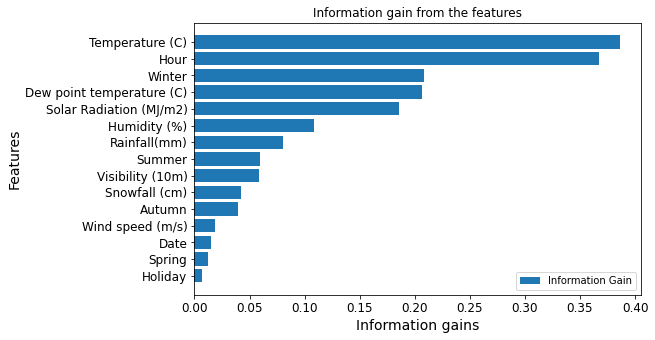

In [145]:
# Here we will use X_t and Y_t data, these are the train data from section 3

cols_set = feature_eng.columns[:-1]
info_gain = mutual_info_regression(X_t,Y_t)
df_ig = pd.DataFrame(data=list(info_gain), index=list(cols_set), columns=["Information gain"])
df_ig = df_ig.sort_values(by="Information gain", ascending=False)
plt.figure(figsize=(8, 5))
plt.barh(y=df_ig.index[::-1], width=list(df_ig["Information gain"][::-1]), 
         label="Information Gain")
plt.title("Information gain from the features")
plt.xlabel("Information gains")
plt.ylabel("Features")
plt.legend(loc=4) 
plt.show()

From the above analysis we cans ee that following feature has low importnace: 
- Date
- Spring
- Holiday
- Rainfall
- Snowfall 
- Autumn

Therefore we will consider these features for discaring.

In [146]:
del feature_eng["Rainfall(mm)"]
del feature_eng["Snowfall (cm)"]
del feature_eng["Holiday"]
del feature_eng["Autumn"]
del feature_eng["Date"]
del feature_eng["Spring"]

<font color="red">**Removing the outliers from the train data**</font>

-  We did not do the outlier remove in the begining of the analysis because, by doing so we are involving the test data during the outlier analysis.

- Hence, we are removing the outliers from train data.

- We remove the outliers above the upper bound that is Q3+1.5 * IQR and lower bound as Q1-1.5 * IQR

In [147]:
def outlierix(data):
    '''Outlier removing function'''
    z = zoutlier(data)
    ub, lb = getbounds(z)
    ixlst = list(set(list(z[z<lb].index)+list(z[z>=ub].index)))
    return ixlst

In [148]:
alloutix = []
for c in feature_eng.columns:
    ox = outlierix(feature_eng[c])
    print("Total outliers {} from feature {}".format(len(ox), c))
    alloutix = alloutix+ox
print("Total removable sample are: ", len(alloutix))

Total outliers 0 from feature Hour
Total outliers 1 from feature Temperature (C)
Total outliers 3 from feature Humidity (%)
Total outliers 74 from feature Wind speed (m/s)
Total outliers 0 from feature Visibility (10m)
Total outliers 0 from feature Dew point temperature (C)
Total outliers 554 from feature Solar Radiation (MJ/m2)
Total outliers 0 from feature Winter
Total outliers 0 from feature Summer
Total outliers 124 from feature Rented Bike Count
Total removable sample are:  756


In [149]:
# Dropping all the outlier indexes

feature_eng.drop(alloutix, axis=0, inplace=True)

In [151]:
# using the above data for prediction

trainset_clean = feature_eng.copy()
Xclean, Yclean = trainset_clean.iloc[:, :-1].values, trainset_clean.iloc[:, -1].values
xtrain_clean, xvalid_clean, ytrain_clean, yvalid_clean = train_test_split(Xclean,
                                                                         Yclean, test_size=0.2,
                                                                         shuffle=True, random_state=53)

# scaling on X data 

Xscaler = preprocess_pipeline.steps[1][0][1].fit(xtrain_clean)
Xtrain_scaled = Xscaler.transform(xtrain_clean) 
Xvalid_scaled = Xscaler.transform(xvalid_clean)

# scaling on Y data 

Yscaler = preprocess_pipeline.steps[1][0][1].fit(ytrain_clean.reshape(-1,1))
Ytrain_scaled = Yscaler.transform(ytrain_clean.reshape(-1,1)) 
Yvalid_scaled = Yscaler.transform(yvalid_clean.reshape(-1,1))

In [152]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR

**Fitting the train data and predicting the train data (Underfit testing)**

RMSE of the Kernel ridge regression is:  410.2089723053724
R2 score of the Kernel ridge regression is:  53.36


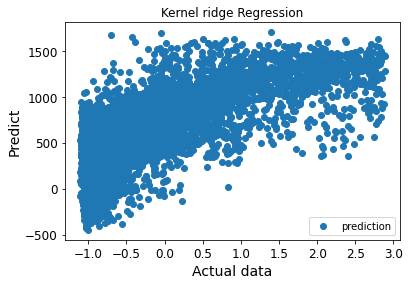

In [154]:
kreg = Kernelridge_pipeline["Kernel ridge"].fit(Xtrain_scaled, Ytrain_scaled)
predict_kreg = kreg.predict(Xtrain_scaled)
predict_kreg_inverse = Yscaler.inverse_transform(predict_kreg.reshape(-1,1))
print("RMSE of the Kernel ridge regression is: ",
     np.sqrt(mean_squared_error(ytrain_clean, predict_kreg_inverse)))
print("R2 score of the Kernel ridge regression is: ",
     round(r2_score(ytrain_clean, predict_kreg_inverse)*100,2))

plt.scatter(Ytrain_scaled, predict_kreg_inverse, label="prediction")
plt.title("Kernel ridge Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- From the above analysis we can see that the prediction are better than the without considering the variable importance.
- Our RMSE is 410 while before it was 426 therefore, having variable importance helps in prediting better

RMSE of the SVR regression is:  303.48846050828257
R2 score of the SVR regression is:  74.47


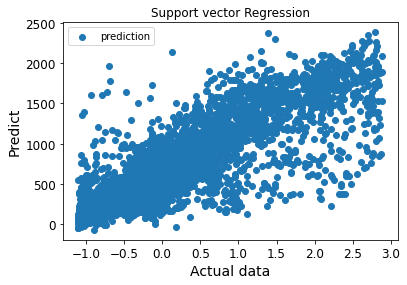

In [155]:
svr_ = svr_pipeline["SVR"].fit(Xtrain_scaled,Ytrain_scaled.ravel())
predict_svr = svr_.predict(Xtrain_scaled)
predict_svr_inverse = Yscaler.inverse_transform(predict_svr.reshape(-1,1))
print("RMSE of the SVR regression is: ",
     np.sqrt(mean_squared_error(ytrain_clean, predict_svr_inverse)))
print("R2 score of the SVR regression is: ",
     round(r2_score(ytrain_clean, predict_svr_inverse)*100,2))

plt.scatter(Ytrain_scaled, predict_svr_inverse, label="prediction")
plt.title("Support vector Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- The prediction for underfit test is learning better and we can say that there is no underfitting involved.

- The prediction is better than without considering the variable importance

**Fitting the train data and predicting the validation data (Prediction)**

RMSE of the Kernel ridge regression is:  416.50745540411657
R2 score of the Kernel ridge regression is:  51.75


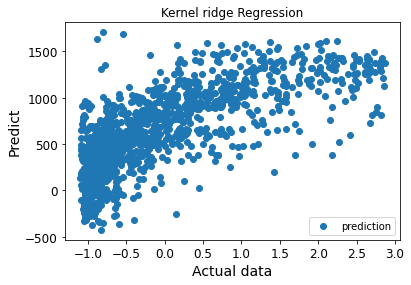

In [156]:
kreg = Kernelridge_pipeline["Kernel ridge"].fit(Xtrain_scaled, Ytrain_scaled)
predict_kreg = kreg.predict(Xvalid_scaled)
predict_kreg_inverse = Yscaler.inverse_transform(predict_kreg.reshape(-1,1))
print("RMSE of the Kernel ridge regression is: ",
     np.sqrt(mean_squared_error(yvalid_clean, predict_kreg_inverse)))
print("R2 score of the Kernel ridge regression is: ",
     round(r2_score(yvalid_clean, predict_kreg_inverse)*100,2))

plt.scatter(Yvalid_scaled, predict_kreg_inverse, label="prediction")
plt.title("Kernel ridge Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- predition using the variable importance has improved the overall RMSE
- prediction is improving and we can see that actual and predicted are in linear relation showing some relation.

RMSE of the SVR regression is:  302.75060189695347
R2 score of the SVR regression is:  74.51


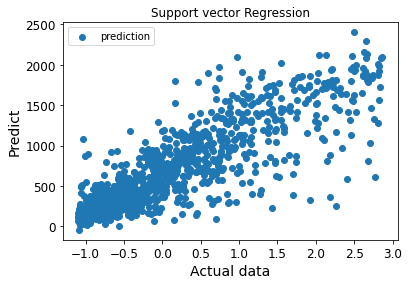

In [157]:
svr_ = svr_pipeline["SVR"].fit(Xtrain_scaled,Ytrain_scaled.ravel())
predict_svr = svr_.predict(Xvalid_scaled)
predict_svr_inverse = Yscaler.inverse_transform(predict_svr.reshape(-1,1))
print("RMSE of the SVR regression is: ",
     np.sqrt(mean_squared_error(yvalid_clean, predict_svr_inverse)))
print("R2 score of the SVR regression is: ",
     round(r2_score(yvalid_clean, predict_svr_inverse)*100,2))

plt.scatter(Yvalid_scaled, predict_svr_inverse, label="prediction")
plt.title("Support vector Regression")
plt.ylabel("Predict")
plt.xlabel("Actual data")
plt.legend()
plt.show() 

- Support vector regresison has shown the lowest RMSE comapring all othe method.
- Support vector regresison has predicted the data very well comapring the method without variable importance.
- Therefore we will use this model for optimization and we will continue using the variable importance method for better performance.

## Step 4: Cross validation (20%)

**Perform a *10 fold cross validation* for each model.** This splits the training set (that we've used above) into 10 equal size subsets, and uses each in turn as the validation set while training a model with the other 9. You should therefore have 10 rmse values for each cross validation run.

**Display the mean and standard deviation of the rmse values** obtained for each model **for the validation splits** using the same settings/parameters for the models as used above. **Also display the mean and standard deviation** of the rmse values obtained for the **training data splits**.

**<font color="red">K Fold cross validation</font>**

In [158]:
from sklearn.model_selection import KFold

In [161]:
k = 10
kf = KFold(n_splits=k)
X_kf = feature_eng.iloc[:, :-1].values
y_kf = feature_eng.iloc[:, -1].values

In [166]:
rmse_kridge_valid = []
rmse_svr_valid = []
rmse_kridge_train = []
rmse_svr_train = []
rmse_linear_valid = []
rmse_linear_train= []


for train_ix, valid_ix in kf.split(X_kf):
    
    xtrain_kf, xvalid_kf = X_kf[train_ix], X_kf[valid_ix]
    ytrain_kf, yvalid_kf = y_kf[train_ix], y_kf[valid_ix]
    
    
    # Scaling on X data
    
    Xscaler_kf = preprocess_pipeline.steps[1][0][1].fit(xtrain_kf)
    xtrain_kf_scaled = Xscaler_kf.transform(xtrain_kf)
    xvalid_kf_scaled = Xscaler_kf.transform(xvalid_kf)
    
    
    # Scaling on Y data
    
    Yscaler_kf = preprocess_pipeline.steps[1][0][1].fit(ytrain_kf.reshape(-1,1))
    ytrain_kf_scaled = Yscaler_kf.transform(ytrain_kf.reshape(-1,1))
    Yvalid_kf_scaled = Yscaler_kf.transform(yvalid_kf.reshape(-1,1))
    
    # Linear regression
    
    model_1 = linear_pipeline['Linear Regression Model'].fit(xtrain_kf_scaled, ytrain_kf_scaled.ravel())
    model_1_pred_valid = model_1.predict(xvalid_kf_scaled)
    model_1_pred_train = model_1.predict(xtrain_kf_scaled)
    model_1_pred_valid_inv = Yscaler_kf.inverse_transform(model_1_pred_valid.reshape(-1,1))
    model_1_pred_train_inv = Yscaler_kf.inverse_transform(model_1_pred_train.reshape(-1,1))
    rmse_linear_valid.append(np.sqrt(mean_squared_error(yvalid_kf, model_1_pred_valid_inv)))
    rmse_linear_train.append(np.sqrt(mean_squared_error(ytrain_kf, model_1_pred_train_inv)))
    
    # Kernel regression
    model_2 = Kernelridge_pipeline["Kernel ridge"].fit(xtrain_kf_scaled, ytrain_kf_scaled.ravel())
    model_2_pred_valid = model_2.predict(xvalid_kf_scaled)
    model_2_pred_train = model_2.predict(xtrain_kf_scaled)
    model_2_pred_valid_inv = Yscaler_kf.inverse_transform(model_2_pred_valid.reshape(-1,1))
    model_2_pred_train_inv = Yscaler_kf.inverse_transform(model_2_pred_train.reshape(-1,1))
    rmse_kridge_valid.append(np.sqrt(mean_squared_error(yvalid_kf, model_2_pred_valid_inv)))
    rmse_kridge_train.append(np.sqrt(mean_squared_error(ytrain_kf, model_2_pred_train_inv)))
    
    # Support vector regression
    
    model_3 = svr_pipeline["SVR"].fit(xtrain_kf_scaled, ytrain_kf_scaled.ravel()) 
    model_3_pred_valid = model_3.predict(xvalid_kf_scaled)
    model_3_pred_train = model_3.predict(xtrain_kf_scaled)
    model_3_pred_valid_inv = Yscaler_kf.inverse_transform(model_3_pred_valid.reshape(-1,1))
    model_3_pred_train_inv = Yscaler_kf.inverse_transform(model_3_pred_train.reshape(-1,1))
    rmse_svr_valid.append(np.sqrt(mean_squared_error(yvalid_kf, model_3_pred_valid_inv)))
    rmse_svr_train.append(np.sqrt(mean_squared_error(ytrain_kf, model_3_pred_train_inv)))

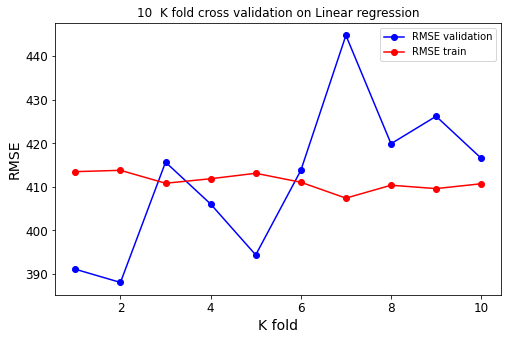

In [167]:
plt.figure(figsize=(8,5))
plt.plot([x for x in range(1, k+1)], rmse_linear_valid, color="blue",
        marker="o", label="RMSE validation")
plt.plot([x for x in range(1, k+1)], rmse_linear_train, color="red",
        marker="o", label="RMSE train")
plt.title("10  K fold cross validation on Linear regression")
plt.xlabel("K fold")
plt.ylabel("RMSE")
plt.legend()
plt.show() 

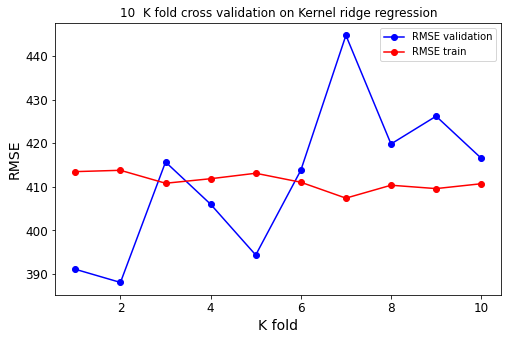

In [168]:
plt.figure(figsize=(8,5))
plt.plot([x for x in range(1, k+1)], rmse_kridge_valid, color="blue",
        marker="o", label="RMSE validation")
plt.plot([x for x in range(1, k+1)], rmse_kridge_train, color="red",
        marker="o", label="RMSE train")
plt.title("10  K fold cross validation on Kernel ridge regression")
plt.xlabel("K fold")
plt.ylabel("RMSE")
plt.legend()
plt.show() 

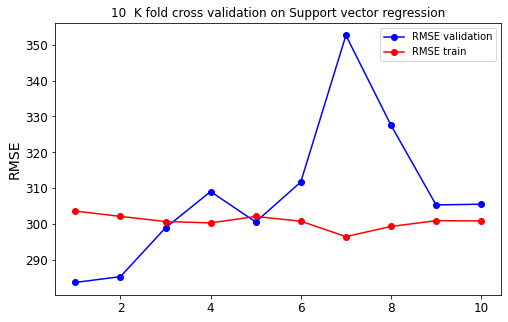

In [169]:
plt.figure(figsize=(8,5))
plt.plot([x for x in range(1, k+1)], rmse_svr_valid, color="blue",
        marker="o", label="RMSE validation")
plt.plot([x for x in range(1, k+1)], rmse_svr_train, color="red",
        marker="o", label="RMSE train")
plt.title("10  K fold cross validation on Support vector regression")
plt.ylabel("RMSE")
plt.legend()
plt.show() 

**Mean and standard devaiation RMSE FOR Linear model with validation data**

In [171]:
mean_rmse_linear_valid = np.mean(rmse_linear_valid)
std_rmse_linear_valid = np.std(rmse_linear_valid)

mean_rmse_linear_train = np.mean(rmse_linear_train)
std_rmse_linear_train = np.std(rmse_linear_train)

print("Mean RMSE of validation data using linear regression is: ", mean_rmse_linear_valid)
print("Standard devaition RMSE of validation data using linear regression is: ", std_rmse_linear_valid)

print("Mean RMSE of training data using linear regression is: ", mean_rmse_linear_train)
print("Standard devaition RMSE of training data using linear regression is: ", std_rmse_linear_train)

Mean RMSE of validation data using linear regression is:  411.6534384853803
Standard devaition RMSE of validation data using linear regression is:  16.523198061465997
Mean RMSE of training data using linear regression is:  411.23221743400853
Standard devaition RMSE of training data using linear regression is:  1.8463133962066247


In [174]:
mean_rmse_kridge_valid = np.mean(rmse_kridge_valid)
std_rmse_kridge_valid = np.std(rmse_kridge_valid)

mean_rmse_kridge_train = np.mean(rmse_kridge_train)
std_rmse_kridge_train = np.std(rmse_kridge_train)

print("Mean RMSE of validation data using kernel regression is: ", mean_rmse_kridge_valid)
print("Standard devaition RMSE of validation data using kernel regression is: ", std_rmse_kridge_valid)

print("Mean RMSE of training data using kernel regression is: ", mean_rmse_kridge_train)
print("Standard devaition RMSE of training data using kernel regression is: ", std_rmse_kridge_train)

Mean RMSE of validation data using kernel regression is:  411.64771140573004
Standard devaition RMSE of validation data using kernel regression is:  16.513655874281724
Mean RMSE of training data using kernel regression is:  411.2326149199868
Standard devaition RMSE of training data using kernel regression is:  1.846274044722254


In [175]:
mean_rmse_svr_valid = np.mean(rmse_svr_valid)
std_rmse_svr_valid = np.std(rmse_svr_valid)

mean_rmse_svr_train = np.mean(rmse_svr_train)
std_rmse_svr_train = np.std(rmse_svr_train)

print("Mean RMSE of validation data using support vector regression is: ", mean_rmse_svr_valid)
print("Standard devaition RMSE of validation data using support vector regression is: ", std_rmse_svr_valid)

print("Mean RMSE of training data using support vector regression is: ", mean_rmse_svr_train)
print("Standard devaition RMSE of training data using support vector regression is: ", std_rmse_svr_train)

Mean RMSE of validation data using support vector regression is:  308.06185656144817
Standard devaition RMSE of validation data using support vector regression is:  19.065322072702383
Mean RMSE of training data using support vector regression is:  300.75891579186066
Standard devaition RMSE of training data using support vector regression is:  1.7971623016638805


<font color="green">On the basis of the results you found above, would you say that any of the models ere **under-fitting or over-fitting**?  

**Which method do you think is the best** out of these three?</font>

From the above analysis,

- Models ar performing good. However, Linear regession and kernel ridge regresison has similar performance in train and validation data, so w ecan also say that they are some what underfitting.

- Support vector regression is the best method

## Step 5: Grid parameter search (15%)

Both the Kernel Ridge Regression and Support Vector Regression have hyperparameters that can be adjusted to suit the problem. **Choose either the KernelRidge or SVR** (your choice entirely), and use grid search to systematically compare the generalisation performance (rmse) obtained with different hyperparameter settings (still with 10-fold CV). Use the sklearn function `GridSearchCV` to do this. 

For KernelRidge, vary the hyperparameter `alpha`.

For SVR, vary the hyperparameter `C`.

**Print out the hyperparameter setting** for the best (i.e. chosen) method. 

Finally, **train and apply your chosen method**, with appropriate hyperparameter settings, to the ***test set* and report the performance**. 

In [176]:
# feature_eng as our primary train data
# devset is our hold out set, we will remove the columns that are not needed as per feature eng

primary_train = feature_eng.copy()
dev_test = devset.copy()
dev_test = dev_test[primary_train.columns]

primary_train = primary_train.values
dev_test = dev_test.values

In [177]:
Xp_t = primary_train[:, :-1]
Yp_t = primary_train[:, -1]

Xd_t = dev_test[:, :-1]
Yd_t = dev_test[:, -1]

In [180]:
# Scaler on X

Xscaler_grid = preprocess_pipeline.steps[1][0][1].fit(Xp_t)
Xscaler_grid_train = Xscaler_grid.transform(Xp_t)
Xscaler_grid_dev = Xscaler_grid.transform(Xd_t)

In [181]:
# Scaler on Y

Yscaler_grid = preprocess_pipeline.steps[1][0][1].fit(Yp_t.reshape(-1,1))
Yscaler_grid_train = Yscaler_grid.transform(Yp_t.reshape(-1,1))
Yscaler_grid_dev = Yscaler_grid.transform(Yd_t.reshape(-1,1))

In [182]:
from sklearn.model_selection import GridSearchCV

In [184]:
parameter = {'C':[5, 10, 15, 20]}
sim_svr = svr_pipeline["SVR"]
grid_svr = GridSearchCV(sim_svr, param_grid=parameter, cv=10)
grid_svr.fit(Xscaler_grid_train, Yscaler_grid_train.ravel())

GridSearchCV(cv=10, estimator=SVR(), param_grid={'C': [5, 10, 15, 20]})

In [186]:
# extracting the best parameter
print("The best parameter for the SVR is: ", grid_svr.best_estimator_)

The best parameter for the SVR is:  SVR(C=20)


In [187]:
# Using the optimised parameter on the developement test
reg_sv = SVR(kernel='rbf', C=20).fit(Xscaler_grid_train, Yscaler_grid_train.ravel())
pred_sv = reg_sv.predict(Xscaler_grid_dev)
pred_sv_inv = Yscaler_grid.inverse_transform(pred_sv.reshape(-1,1))

In [188]:
# RMSE
np.sqrt(mean_squared_error(Yd_t, pred_sv_inv))

318.5029831264209

In [190]:
# r2 SCORE
r2_score(Yd_t, pred_sv_inv)

0.7313628367175804

- From the above prediction we can say that our prediction is working well.
- The model has genralised the unseen data
- Our prediction model has the low RMSE of 318 and R2 score of fitting is 73.13%

**How different was the test set performance to the validation performance, and is this suggestive of over-fitting, under-fitting or neither?**

**Comparision**

* our validation data has LOW RMSE OF 308
* Our test data has a RMSE of 318
* Indeed, RMSE is high in test data, but this high is not very high to conclude that model is not performing well. The model has generalised better than any other model that is linear regression and kerenel ridge regression.
* Support vector regresison has predicted better.
* Support vector regression has no underfitting and overfitting it is fiiting the unseen data very well.